In [51]:
! pip install numpy==1.19.0
! pip install pandas==1.4.0
! pip install matplotlib==3.6.1
! pip install seaborn==0.12.0
! pip install scipy==1.9.2
! pip install mycolorpy==1.5.1
! pip install smartprint==1.0.5

import os
from os import path
import pickle as pk
import pandas as pd
from glob import glob
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns
import numpy as np
from scipy.stats import ttest_ind
from smartprint import smartprint as sprint
plt.rcParams.update({"font.size": 18})

In [52]:
! bash ../split_train_val.sh

In [53]:
import pandas as pd
import os

# File paths
files = [
    '../feature_importance_max_25x25_val.csv',
    '../feature_importance_mean_25x25_val.csv',
    '../feature_importance_max_50x50_val.csv',
    '../feature_importance_mean_50x50_val.csv',
    '../feature_importance_max_100x100_val.csv',
    '../feature_importance_mean_100x100_val.csv'
]

# Create an empty list to store aggregated dataframes
dfs_aggregated = []

for file in files:
    # Load the CSV into a DataFrame
    df = pd.read_csv(file)
    
    # Aggregate the data
    aggregated_df = df.groupby(['CityName', 'Scale', 'TOD', 'Marker', 'Feature']).mean().reset_index()

    # Append the aggregated dataframe to the list
    dfs_aggregated.append(aggregated_df)
    
    # Save the aggregated dataframe as a new CSV
    new_filename = os.path.basename(file).replace(".csv", "_aggregated.csv")
    new_filepath = os.path.join("../", new_filename)
    aggregated_df.to_csv(new_filepath, index=False)

# Combine the aggregated dataframes
combined_df = pd.concat(dfs_aggregated, ignore_index=True)

# You can now proceed with your analysis on the combined_df.


### Analyze overall

In [54]:
feature_mean_importance = combined_df.groupby('Feature')['Value'].mean().sort_values(ascending=False)
N = 10 
top_10_features = feature_mean_importance.head(N)
sprint(top_10_features)

top_10_features : Feature
metered_count                    0.177027
total_crossings                  0.077051
streets_per_node_proportion_2    0.044439
street_length_total              0.040936
n                                0.039370
betweenness                      0.037979
global_betweenness               0.036704
k_avg                            0.033343
lane_density                     0.033158
non_metered_count                0.020871
Name: Value, dtype: float64


### Analyse max vs mean (Non-recurrent) vs recurrent

In [58]:
import pandas as pd
import os


def find_top_features(files):
    dfs_aggregated = []
    
    for file in files:
        # Load the CSV into a DataFrame
        df = pd.read_csv(file)
        
        # Aggregate the data
        aggregated_df = df.groupby(['CityName', 'Scale', 'TOD', 'Marker', 'Feature']).mean().reset_index()
    
        # Append the aggregated dataframe to the list
        dfs_aggregated.append(aggregated_df)
        
        # Save the aggregated dataframe as a new CSV
        new_filename = os.path.basename(file).replace(".csv", "_aggregated.csv")
        new_filepath = os.path.join("../", new_filename)
        aggregated_df.to_csv(new_filepath, index=False)
    
    # Combine the aggregated dataframes
    combined_df = pd.concat(dfs_aggregated, ignore_index=True)
    
    feature_mean_importance = combined_df.groupby('Feature')['Value'].mean().sort_values(ascending=False)
    N = 7 
    top_10_features = feature_mean_importance.head(N)
    return top_10_features


# File paths
files_max = [
    '../feature_importance_max_25x25_val.csv',
    '../feature_importance_max_50x50_val.csv',
    '../feature_importance_max_100x100_val.csv',
]
files_mean = [
    '../feature_importance_mean_25x25_val.csv',
    '../feature_importance_mean_50x50_val.csv',
    '../feature_importance_mean_100x100_val.csv',
]
files_all = files_max + files_mean

print ("Overall feature importance")
sprint (find_top_features(files_mean + files_max))
print ("------------------------------")

print ("Non recurrent case feature importance")
sprint (find_top_features(files_max))
print ("------------------------------")

print ("Recurrent case feature importance")
sprint (find_top_features(files_mean))
print ("------------------------------")

Overall feature importance
find_top_features(files_mean + files_max) : Feature
metered_count                    0.177027
total_crossings                  0.077051
streets_per_node_proportion_2    0.044439
street_length_total              0.040936
n                                0.039370
betweenness                      0.037979
global_betweenness               0.036704
Name: Value, dtype: float64
------------------------------
Non recurrent case feature importance
find_top_features(files_max) : Feature
metered_count                    0.097177
total_crossings                  0.059603
n                                0.038877
betweenness                      0.037689
k_avg                            0.031357
streets_per_node_proportion_2    0.026477
street_length_total              0.026201
Name: Value, dtype: float64
------------------------------
Recurrent case feature importance
find_top_features(files_mean) : Feature
metered_count                    0.251325
total_crossings       

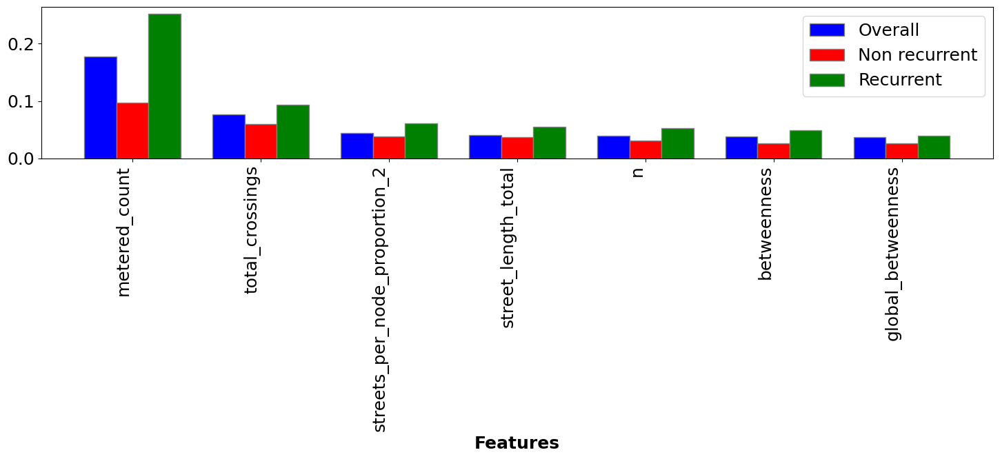

In [59]:
import matplotlib.pyplot as plt
import numpy as np

def plot_grouped_bar(data_dict):
    features = list(data_dict['Overall'].index)
    
    # Set up the bar width and positions
    barWidth = 0.25
    r1 = np.arange(len(features))
    r2 = [x + barWidth for x in r1]
    r3 = [x + barWidth for x in r2]
    
    # Create the grouped bar chart
    plt.figure(figsize=(15,7))
    plt.bar(r1, data_dict['Overall'].values, color='b', width=barWidth, edgecolor='grey', label='Overall')
    plt.bar(r2, data_dict['Non-recurrent'].values, color='r', width=barWidth, edgecolor='grey', label='Non recurrent')
    plt.bar(r3, data_dict['Recurrent'].values, color='g', width=barWidth, edgecolor='grey', label='Recurrent')
    
    # Label the bars
    plt.xlabel('Features', fontweight='bold')
    plt.xticks([r + barWidth for r in range(len(features))], features, rotation=90, ha="right")
    
    # Create legend & Show graphic
    plt.legend()
    plt.tight_layout()
    plt.show()

# Gather the data in a dictionary format for plotting
data_dict = {
    'Non-recurrent': (find_top_features(files_max)),
    'Recurrent': (find_top_features(files_mean)),
    'Overall': (find_top_features(files_mean + files_max)),

}
plot_grouped_bar(data_dict)

#### 

In [60]:
import pandas as pd

def extract_scalewise_importance(files, scale):
    dfs_for_scale = [pd.read_csv(file) for file in files if scale in file]
    combined_df = pd.concat(dfs_for_scale, ignore_index=True)
    feature_importance = combined_df.groupby('Feature')['Value'].mean().sort_values(ascending=False)
    return feature_importance

scales = ["25x25", "50x50", "100x100"]

# For Max Scenario:
print("Max Scenario:")
for scale in scales:
    print(f"\nFeature importances for {scale} scale:")
    feature_importance = extract_scalewise_importance(files_max, scale)
    print(feature_importance)

# Once you get the output for Max scenario, repeat for the Mean scenario:
print("\nMean Scenario:")
for scale in scales:
    print(f"\nFeature importances for {scale} scale:")
    feature_importance = extract_scalewise_importance(files_mean, scale)
    print(feature_importance)


Max Scenario:

Feature importances for 25x25 scale:
Feature
metered_count                    0.096114
betweenness                      0.042474
total_crossings                  0.035826
street_length_total              0.032727
streets_per_node_proportion_2    0.024726
k_avg                            0.023424
global_betweenness               0.022360
n                                0.016561
non_metered_count                0.013363
lane_density                     0.007330
circuity_avg                     0.007063
streets_per_node_proportion_4    0.005339
streets_per_node_avg             0.005158
streets_per_node_count_5         0.004931
m                                0.004653
streets_per_node_proportion_1    0.002732
streets_per_node_count_6         0.002591
streets_per_node_count_3         0.002232
edge_length_total                0.002152
streets_per_node_proportion_5    0.001629
edge_length_avg                  0.001102
Name: Value, dtype: float64

Feature importances for 50x50

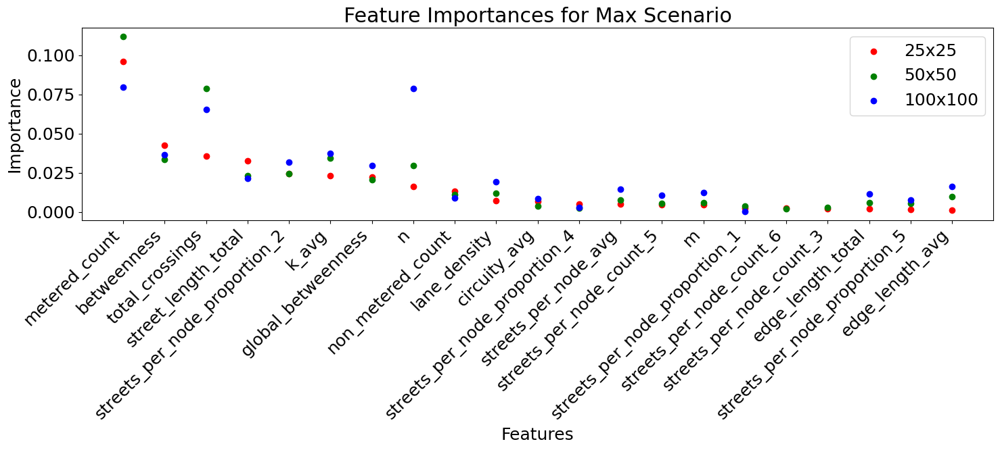

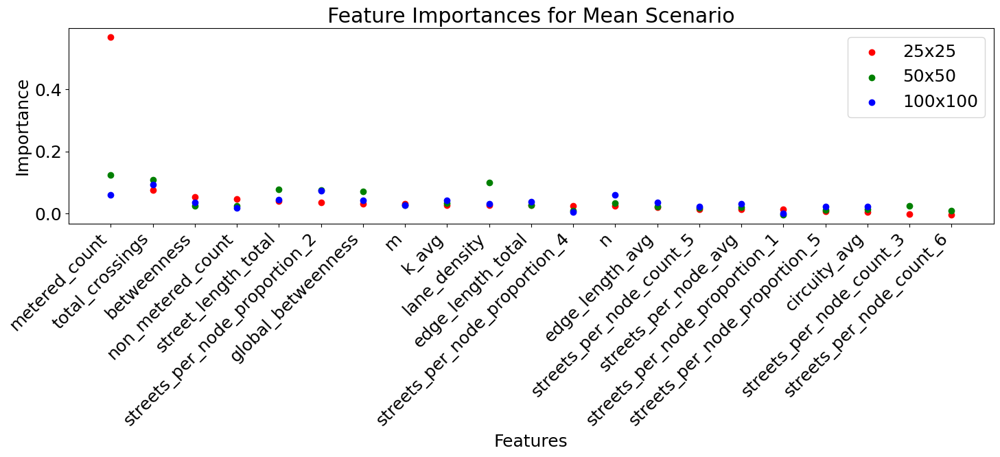

In [65]:
import matplotlib.pyplot as plt

color_dict = {
    '25x25' : "red",
    '50x50' : "green",
    '100x100' : "blue"
}
def plot_feature_importance(files, scenario, scales):
    plt.figure(figsize=(15, 7))

    for scale in scales:
        feature_importance = extract_scalewise_importance(files, scale)
        plt.scatter(feature_importance.index, feature_importance.values, label=scale, color=color_dict[scale])

    plt.title(f"Feature Importances for {scenario} Scenario")
    plt.xlabel("Features")
    plt.ylabel("Importance")
    plt.xticks(rotation=45, ha="right")
    plt.legend()
    plt.tight_layout()
    plt.show()

# Plot for Max Scenario
plot_feature_importance(files_max, "Max", scales)

# Plot for Mean Scenario
plot_feature_importance(files_mean, "Mean", scales)

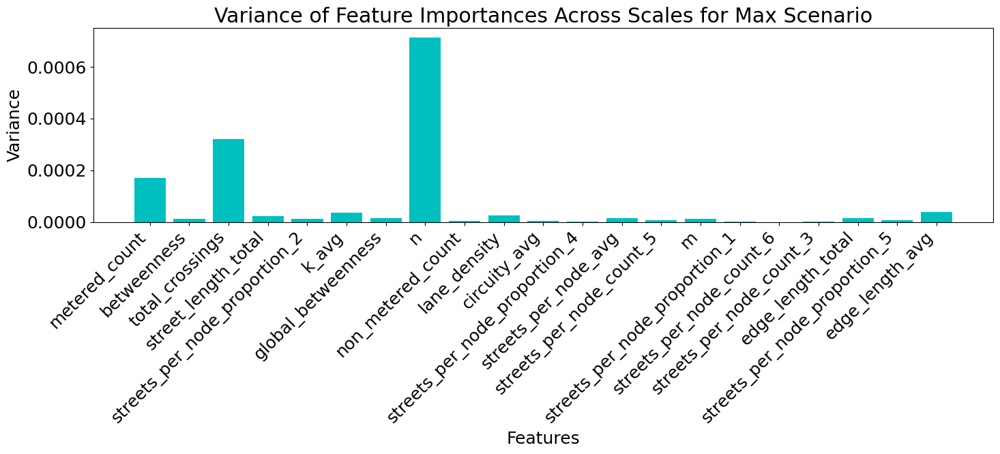

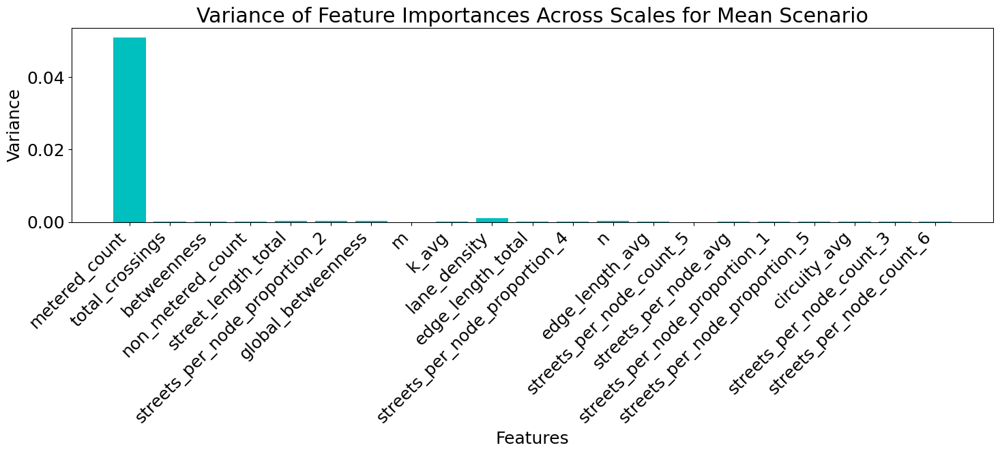

In [68]:
import numpy as np

def compute_variance_across_scales(files, scales):
    all_importances = {}

    for scale in scales:
        feature_importance = extract_scalewise_importance(files, scale)
        for feature, importance in feature_importance.items():
            if feature not in all_importances:
                all_importances[feature] = []
            all_importances[feature].append(importance)

    variances = {}
    for feature, importances in all_importances.items():
        variances[feature] = np.var(importances)
        
    return variances

def plot_variance_across_scales(files, scenario):
    variances = compute_variance_across_scales(files, scales)
    features = list(variances.keys())
    variance_values = list(variances.values())

    plt.figure(figsize=(15, 7))
    plt.bar(features, variance_values, color='c')
    
    plt.title(f"Variance of Feature Importances Across Scales for {scenario} Scenario")
    plt.xlabel("Features")
    plt.ylabel("Variance")
    plt.xticks(rotation=45, ha="right")
    plt.tight_layout()
    plt.show()

# Plot for Max Scenario
plot_variance_across_scales(files_max, "Max")

# Plot for Mean Scenario
plot_variance_across_scales(files_mean, "Mean")


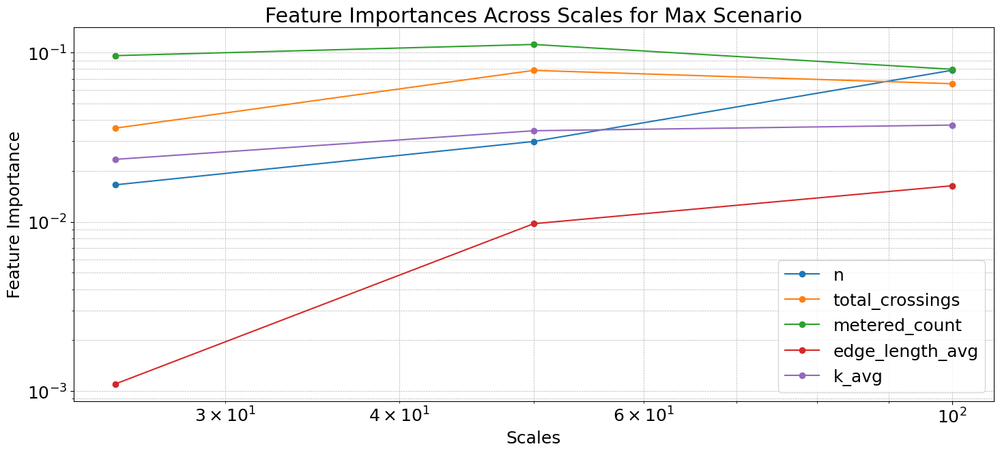

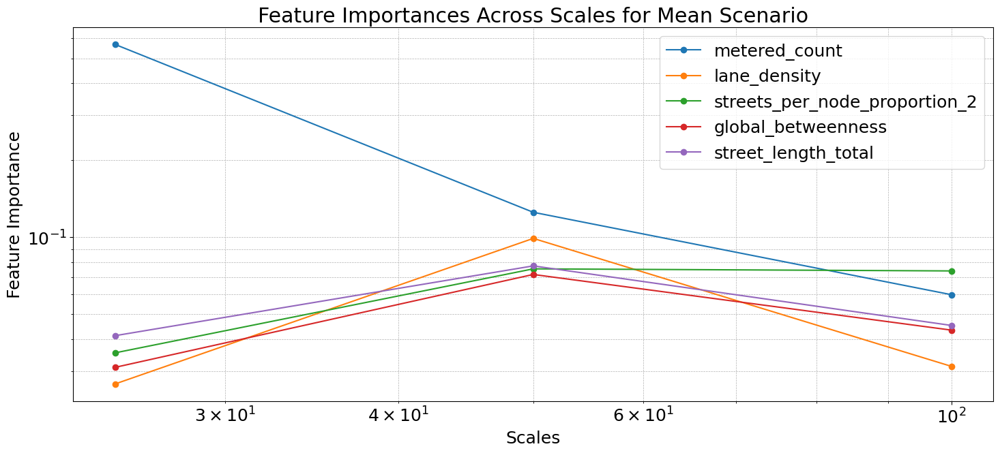

In [93]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

scales = [25, 50, 100]

def extract_scalewise_importance(files, scale):
    dfs_combined = []
    for file in files:
        df = pd.read_csv(file)
        df = df[df['Scale'] == scale]
        dfs_combined.append(df)
        
    combined_df = pd.concat(dfs_combined, ignore_index=True)
    feature_importance = combined_df.groupby('Feature')['Value'].mean().sort_values(ascending=False)
    
    return feature_importance

def compute_variance_across_scales(files, scales):
    all_importances = {}

    for scale in scales:
        feature_importance = extract_scalewise_importance(files, scale)
        for feature, importance in feature_importance.items():
            if feature not in all_importances:
                all_importances[feature] = []
            all_importances[feature].append(importance)

    variances = {}
    for feature, importances in all_importances.items():
        variances[feature] = np.var(importances)
        
    return variances

def plot_variance_across_scales(files, scenario):
    variances = compute_variance_across_scales(files, scales)
    
    # Sort features by variance and take top 5
    sorted_features = sorted(variances.keys(), key=lambda x: variances[x], reverse=True)[:5]
    
    plt.figure(figsize=(15, 7))

    for feature in sorted_features:
        importances = [extract_scalewise_importance(files, scale)[feature] for scale in scales]
        plt.plot(scales, importances, '-o', label=feature)

    plt.title(f"Feature Importances Across Scales for {scenario} Scenario")
    plt.xlabel("Scales")
    plt.ylabel("Feature Importance")
    plt.legend()
    plt.xscale('log')
    plt.yscale('log')
    plt.grid(True, which='both', linestyle='--', linewidth=0.5)
    plt.tight_layout()
    plt.show()

# Plot for Max Scenario
plot_variance_across_scales(files_max, "Max")

# Plot for Mean Scenario
plot_variance_across_scales(files_mean, "Mean")

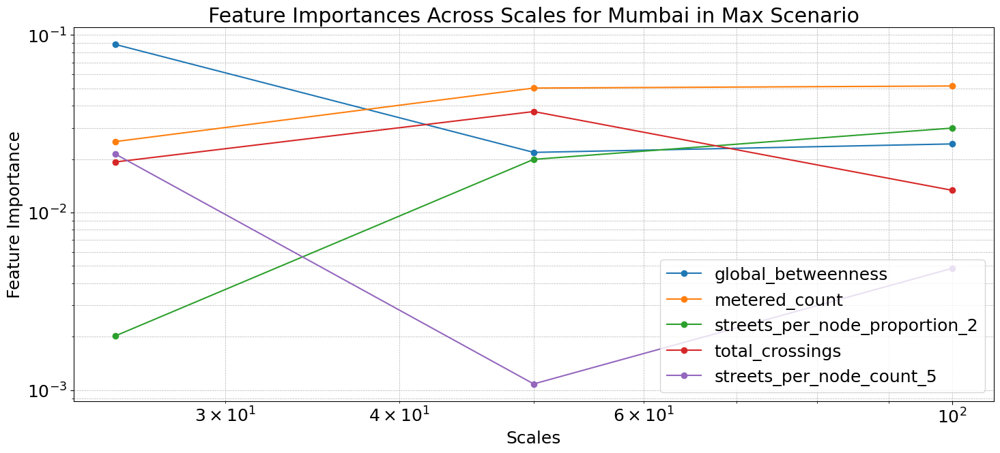

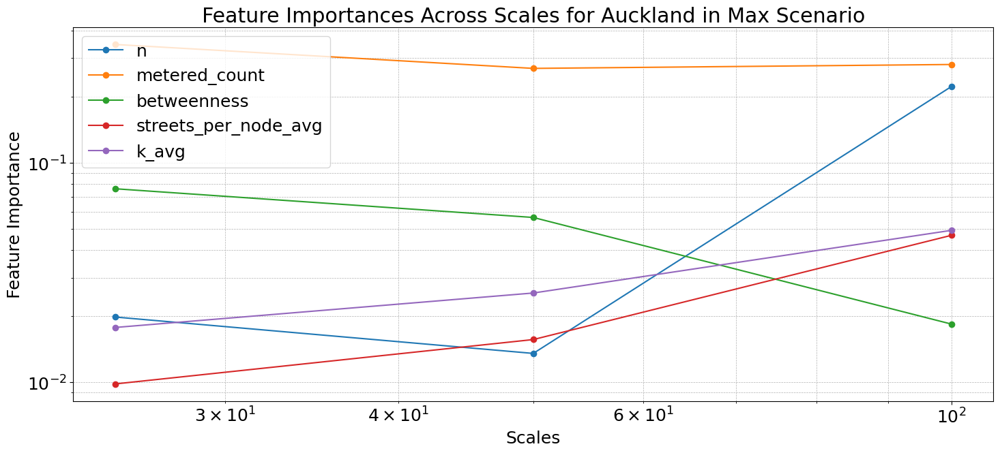

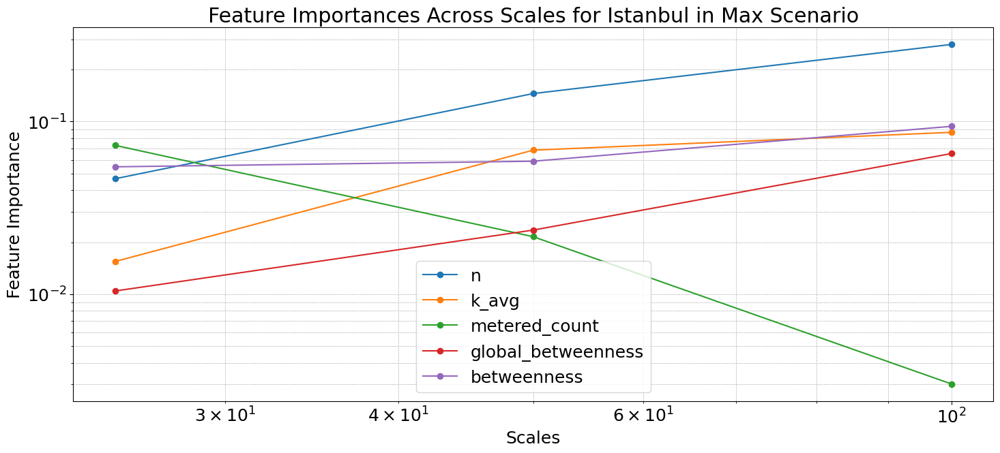

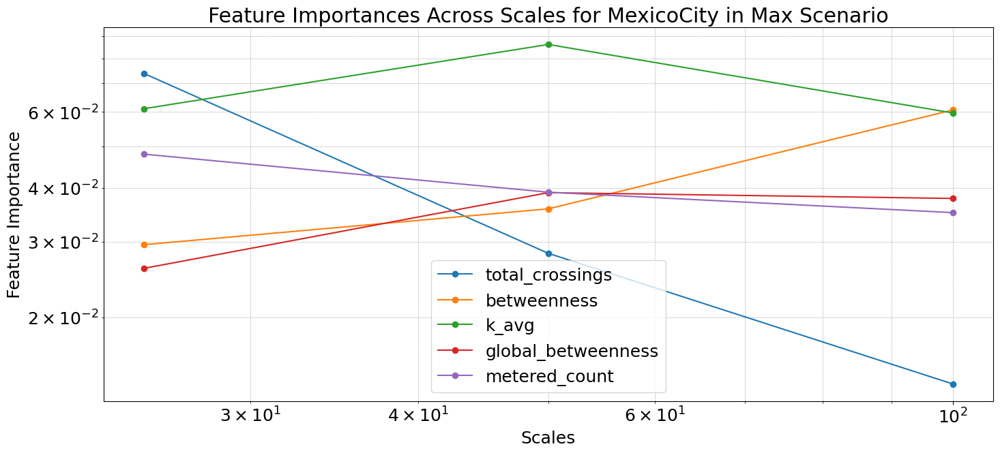

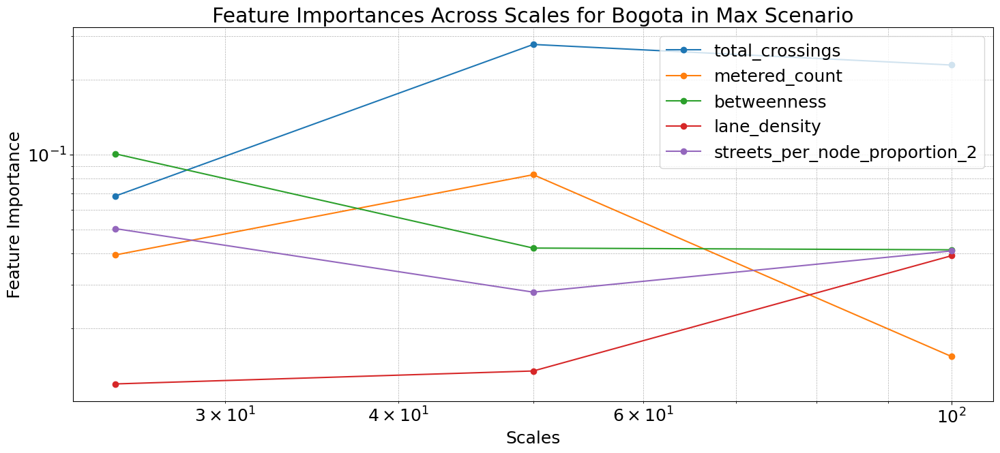

...

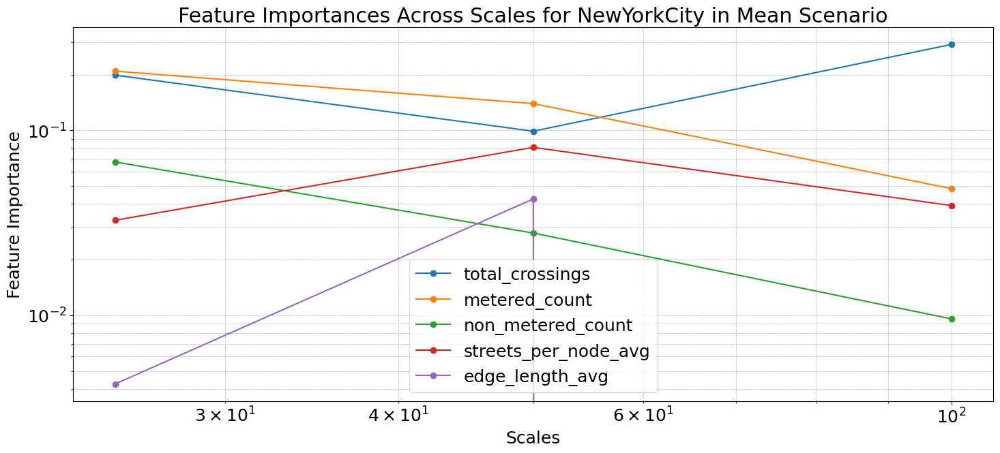

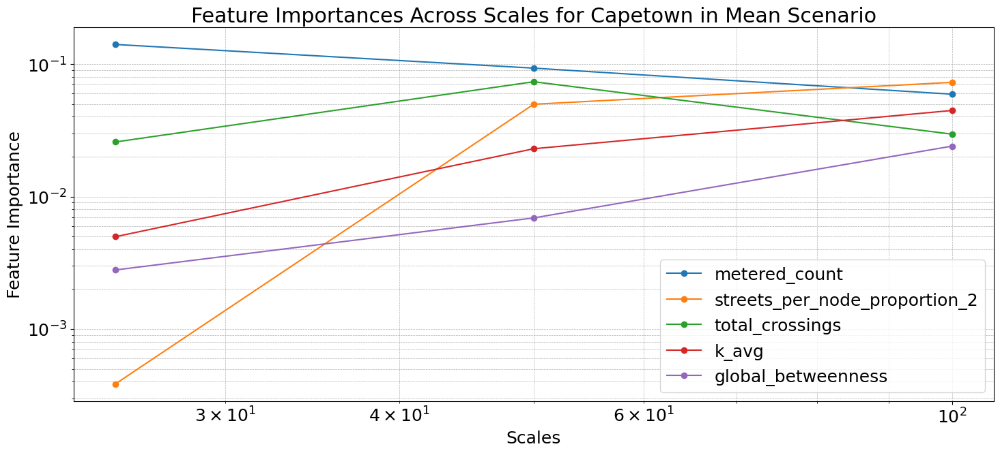

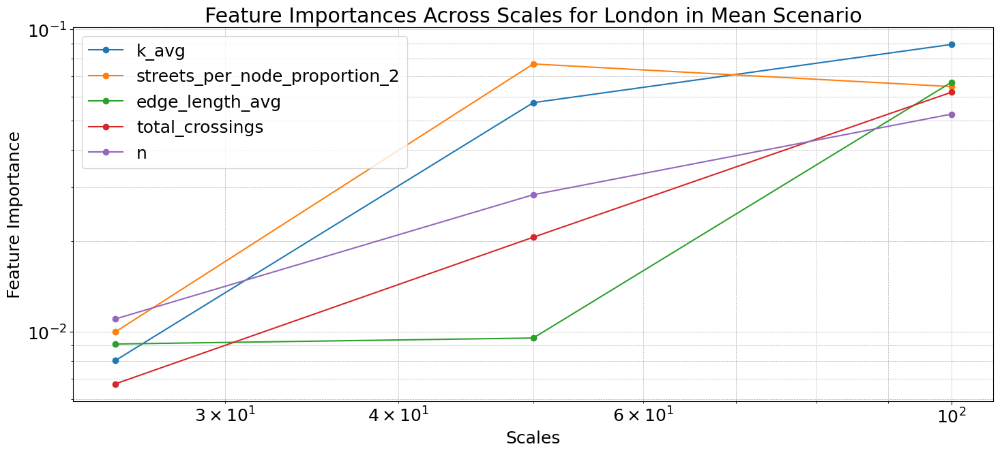

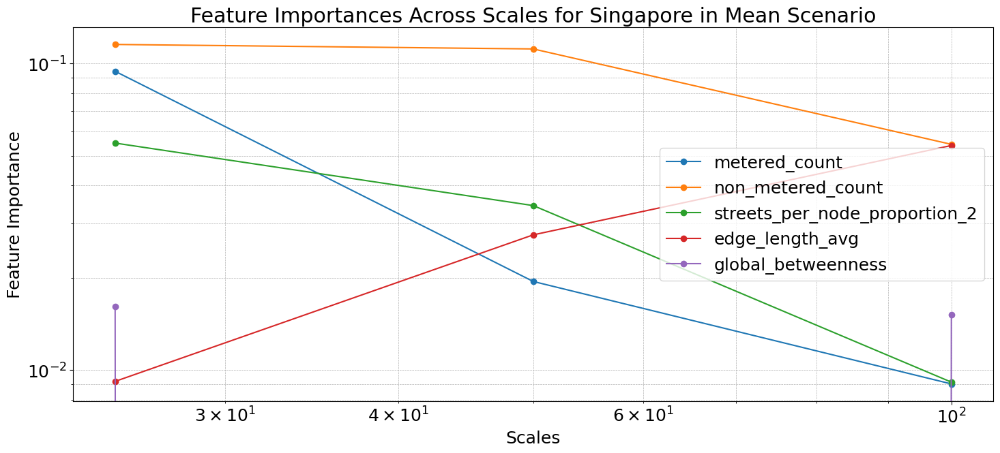

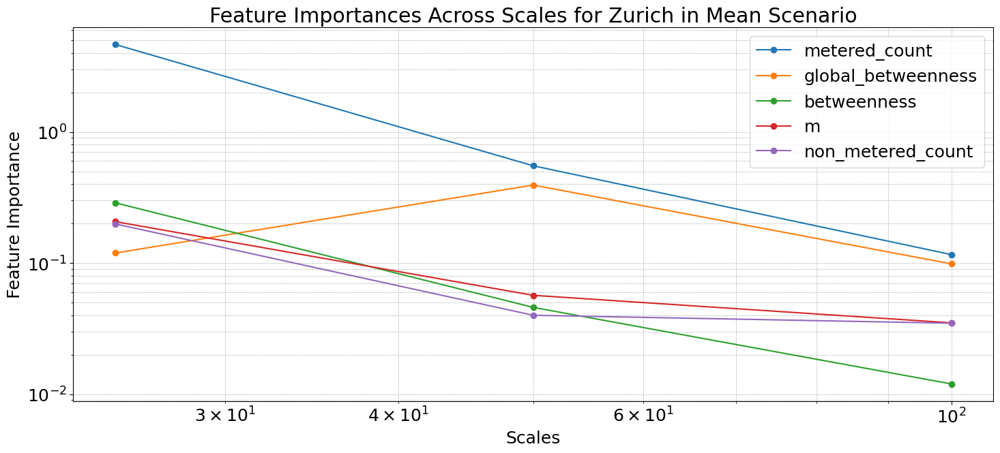

In [96]:
def plot_citywise_variance_across_scales(files, scenario):
    for city in all_cities:
        variances = compute_variance_across_scales_for_city(files, city, scales)

        # Sort features by variance and take top 5
        sorted_features = sorted(variances.keys(), key=lambda x: variances[x], reverse=True)[:5]

        plt.figure(figsize=(15, 7))

        for feature in sorted_features:
            importances = []
            for scale in scales:
                city_scale_importance = extract_city_scalewise_importance(files, city, scale)
                # Check if feature exists before accessing its value
                importance_value = city_scale_importance.get(feature, np.nan)  # Use np.nan for missing features
                importances.append(importance_value)

            plt.plot(scales, importances, '-o', label=feature)

        plt.title(f"Feature Importances Across Scales for {city} in {scenario} Scenario")
        plt.xlabel("Scales")
        plt.ylabel("Feature Importance")
        plt.legend()
        plt.xscale('log')
        plt.yscale('log')
        plt.grid(True, which='both', linestyle='--', linewidth=0.5)
        plt.tight_layout()
        plt.show()

# Plot for Max Scenario
plot_citywise_variance_across_scales(files_max, "Max")

# Plot for Mean Scenario
plot_citywise_variance_across_scales(files_mean, "Mean")

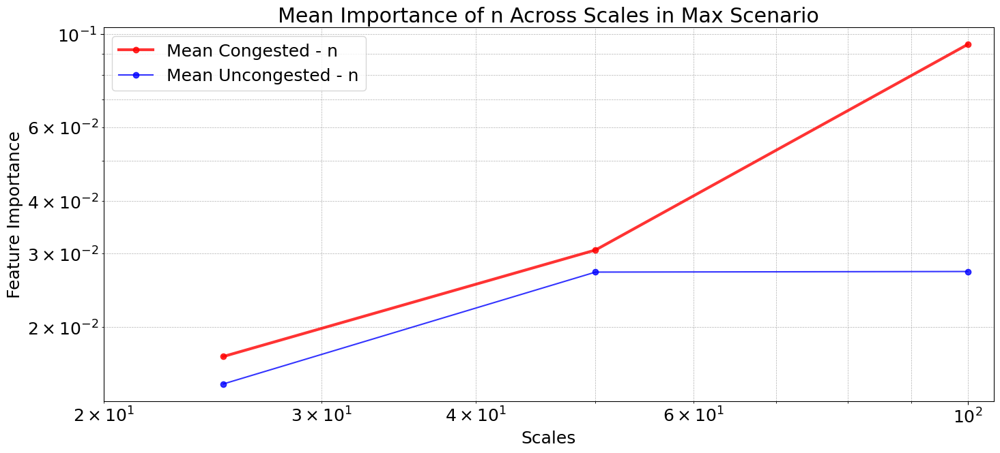

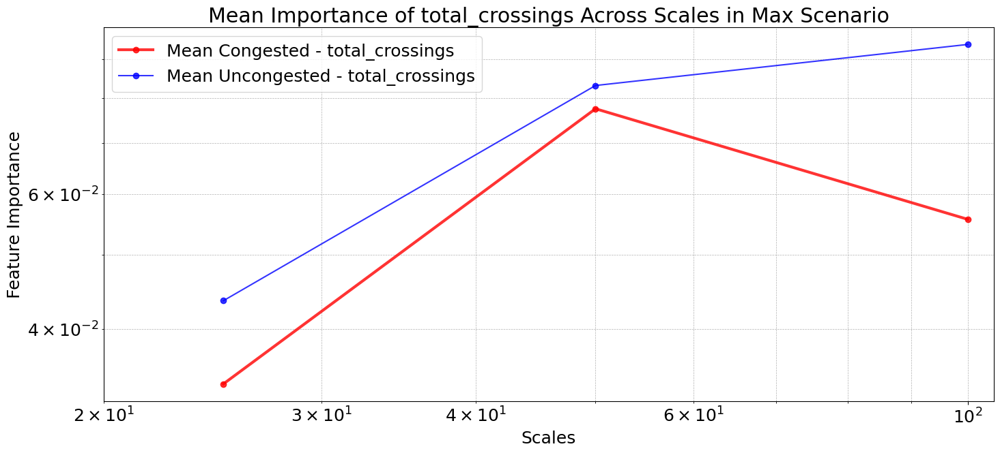

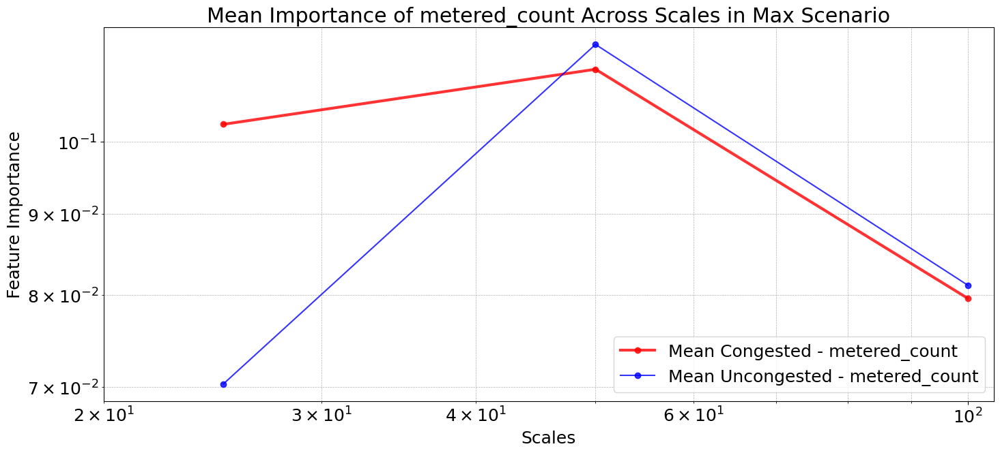

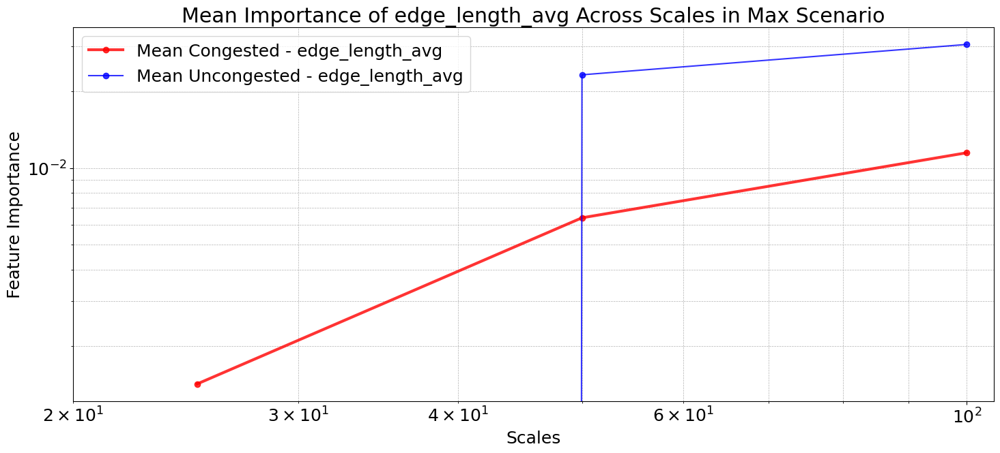

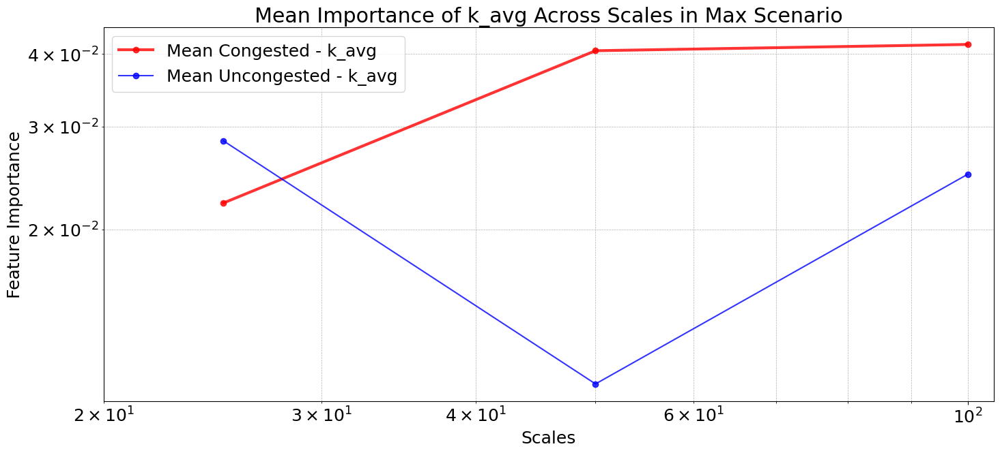

In [114]:
# Placeholder list for congested cities. Replace with your actual list.
congested_cities = "Mumbai|Auckland|Istanbul|MexicoCity|Bogota|NewYorkCity|Capetown|London".split('|')  # replace with actual names
uncongested_cities = ["Singapore", "Zurich"]
def get_mean_importance_for_city_type(files, scales, city_type):
    mean_importances = {}
    
    for scale in scales:
        importances_for_scale = {}
        
        for city in all_cities:
            if (city in congested_cities and city_type == "congested") or (city not in congested_cities and city_type == "uncongested"):
                city_scale_importance = extract_city_scalewise_importance(files, city, scale)
                for feature, importance in city_scale_importance.items():
                    if feature not in importances_for_scale:
                        importances_for_scale[feature] = []
                    importances_for_scale[feature].append(importance)

        for feature in importances_for_scale:
            if feature not in mean_importances:
                mean_importances[feature] = [np.nan] * len(scales)  # Initialize with NaN values of the same length as scales
            mean_importances[feature][scales.index(scale)] = np.nanmean(importances_for_scale[feature])
    
    return mean_importances
def plot_all_cities_variance_across_scales(files, scenario):
    # First, compute the top 5 features by variance across scales
    variances = compute_variance_across_scales(files, scales)
    sorted_features = sorted(variances.keys(), key=lambda x: variances[x], reverse=True)[:5]
    
    # Compute mean importances for congested and uncongested cities
    mean_importances_congested = get_mean_importance_for_city_type(files, scales, "congested")
    mean_importances_uncongested = get_mean_importance_for_city_type(files, scales, "uncongested")

    # Filter the mean importances based on the selected top 5 features
    mean_importances_congested = {k: v for k, v in mean_importances_congested.items() if k in sorted_features}
    mean_importances_uncongested = {k: v for k, v in mean_importances_uncongested.items() if k in sorted_features}

    for feature in sorted_features:
        plt.figure(figsize=(15, 7))

        # If feature is available in congested cities data
        if feature in mean_importances_congested:
            plt.plot(scales, mean_importances_congested[feature], '-o', label=f"Mean Congested - {feature}", linewidth=3, alpha=0.8, color='red')

        # If feature is available in uncongested cities data
        if feature in mean_importances_uncongested:
            plt.plot(scales, mean_importances_uncongested[feature], '-o', label=f"Mean Uncongested - {feature}", linewidth=1.5, alpha=0.8, color='blue')

        plt.title(f"Mean Importance of {feature} Across Scales in {scenario} Scenario")
        plt.xlabel("Scales")
        plt.ylabel("Feature Importance")
        plt.legend()
        plt.xscale('log')
        plt.yscale('log')
        plt.grid(True, which='both', linestyle='--', linewidth=0.5)
        plt.tight_layout()
        plt.xlim(20, 105)
        plt.show()

# Plot for Max Scenario
plot_all_cities_variance_across_scales(files_max, "Max")

# Plot for Mean Scenario (commented out)
# plot_all_cities_variance_across_scales(files_mean, "Mean")


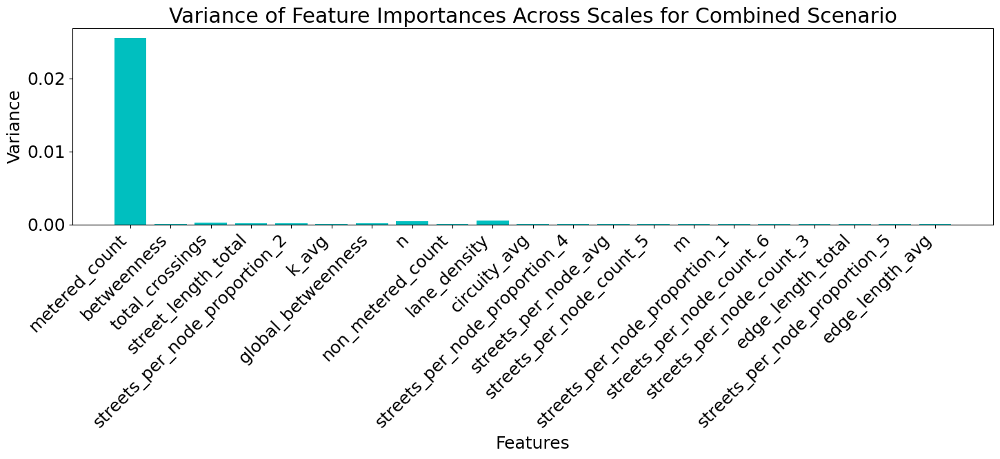

In [69]:
def combine_variances(files_max, files_mean, scales):
    variances_max = compute_variance_across_scales(files_max, scales)
    variances_mean = compute_variance_across_scales(files_mean, scales)
    
    combined_variances = {}
    
    for feature in variances_max.keys():
        combined_variances[feature] = (variances_max.get(feature, 0) + variances_mean.get(feature, 0)) / 2  # Taking average of variances
    
    return combined_variances

def plot_combined_variance(files_max, files_mean, title="Combined"):
    combined_variances = combine_variances(files_max, files_mean, scales)
    features = list(combined_variances.keys())
    variance_values = list(combined_variances.values())

    plt.figure(figsize=(15, 7))
    plt.bar(features, variance_values, color='c')
    
    plt.title(f"Variance of Feature Importances Across Scales for {title} Scenario")
    plt.xlabel("Features")
    plt.ylabel("Variance")
    plt.xticks(rotation=45, ha="right")
    plt.tight_layout()
    plt.show()

# Plot for Combined Scenario
plot_combined_variance(files_max, files_mean)


In [63]:
# add a new columns that simplifies the TOD
def new_datetime(x):
    if (x >= 6 and x <= 10) or (x >= 16 and x < 19):
        return "Peak"
    else:
        return "Off Peak"

# you can vary the daytimes here that you want to compare
time1 = "Peak"
time2 = "Off Peak"

for scale in [25, 50, 100]:
    fname = "feature_importance_max_" + str(scale) + "x" + str(scale) + "_val.csv" 
    print( "......................" )
    sprint (scale)
    data = pd.read_csv(fname)
    data["daytime"] = data["TOD"].apply(new_datetime)
    
    print(f"Difference between {time1} and {time2} is significant for features ...\n")
    for feat in data["Feature"].unique():
        time1_df = data[(data["Feature"] == feat) & (data["daytime"] == time1)]
        time2_df = data[(data["Feature"] == feat) & (data["daytime"] == time2)]
        t_res = ttest_ind(time1_df["Value"], time2_df["Value"])
        if t_res[1] < 0.05:
            print(feat)

......................
scale : 25
Difference between Peak and Off Peak is significant for features ...

edge_length_total
edge_length_avg
streets_per_node_avg
street_length_total
circuity_avg
non_metered_count
lane_density
streets_per_node_proportion_4
streets_per_node_count_5
global_betweenness
......................
scale : 50
Difference between Peak and Off Peak is significant for features ...

n
m
edge_length_total
streets_per_node_avg
street_length_total
metered_count
non_metered_count
total_crossings
betweenness
lane_density
streets_per_node_proportion_1
streets_per_node_proportion_2
streets_per_node_count_5
streets_per_node_proportion_5
global_betweenness
streets_per_node_count_3
streets_per_node_count_6
......................
scale : 100
Difference between Peak and Off Peak is significant for features ...

m
k_avg
edge_length_total
edge_length_avg
streets_per_node_avg
street_length_total
circuity_avg
metered_count
non_metered_count
total_crossings
lane_density
streets_per_node_

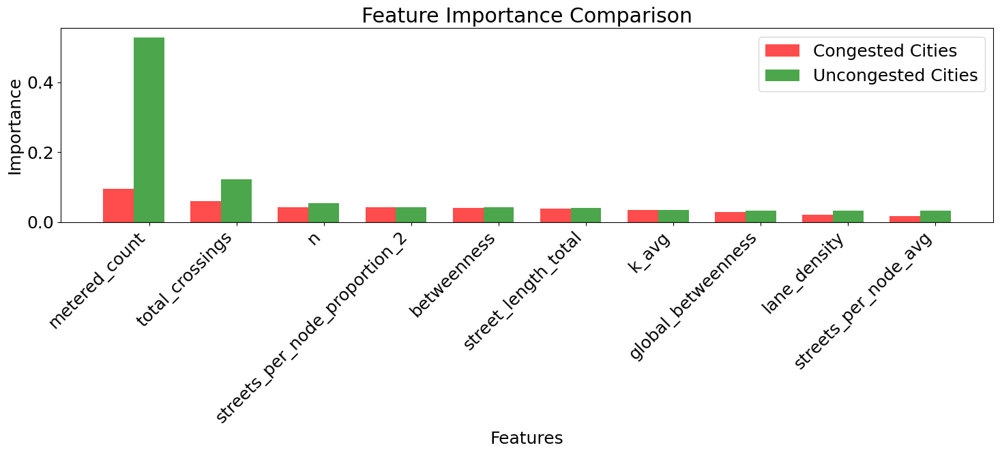

In [73]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Cities List
congested_cities = ["Mumbai", "Auckland", "Istanbul", "MexicoCity", "Bogota", "NewYorkCity", "Capetown", "London"]
uncongested_cities = ["Singapore", "Zurich"]

def compute_feature_importance_by_city_type(files, city_type):
    dfs_combined = []
    
    for file in files:
        df = pd.read_csv(file)
        
        # Filter by city type
        if city_type == "congested":
            df = df[df['CityName'].isin(congested_cities)]
        else:
            df = df[df['CityName'].isin(uncongested_cities)]
        
        dfs_combined.append(df)

    # Combine the dataframes
    combined_df = pd.concat(dfs_combined, ignore_index=True)
    
    # Aggregate feature importance
    feature_importance = combined_df.groupby('Feature')['Value'].mean().sort_values(ascending=False)
    
    return feature_importance

def plot_feature_importance_comparison(files):
    congested_importance = compute_feature_importance_by_city_type(files, "congested")
    uncongested_importance = compute_feature_importance_by_city_type(files, "uncongested")
    
    # Plot
    plt.figure(figsize=(15, 7))
    
    # Top N features for visualization clarity
    N = 10
    barWidth = 0.35
    r1 = np.arange(len(congested_importance.head(N)))
    r2 = [x + barWidth for x in r1]
    
    plt.bar(r1, congested_importance.head(N).values, color='r', width=barWidth, label='Congested Cities', alpha=0.7)
    plt.bar(r2, uncongested_importance.head(N).values, color='g', width=barWidth, label='Uncongested Cities', alpha=0.7)
    
    plt.title("Feature Importance Comparison")
    plt.xlabel("Features")
    plt.ylabel("Importance")
    plt.xticks([r + barWidth for r in range(len(congested_importance.head(N)))], congested_importance.head(N).index, rotation=45, ha="right")
    plt.legend()
    plt.tight_layout()
    plt.show()

# Call the function
plot_feature_importance_comparison(files_all)


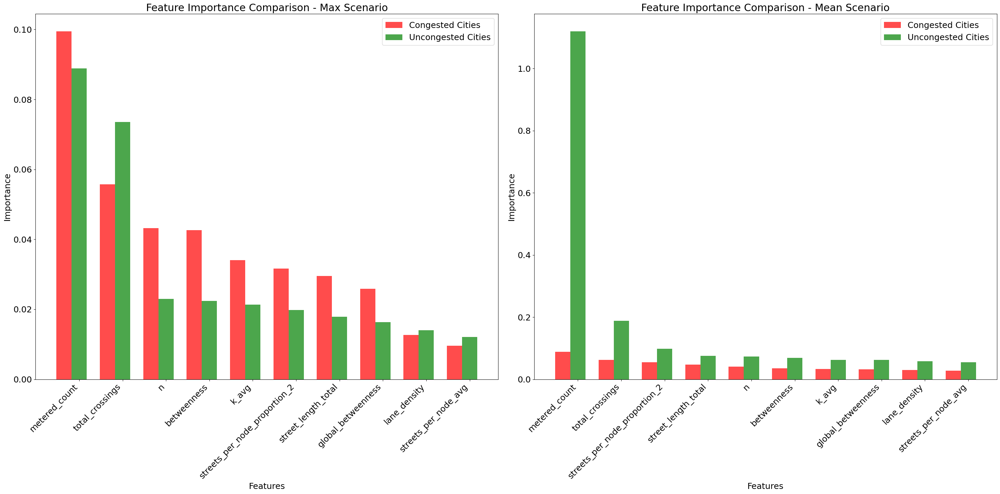

In [74]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Cities List
congested_cities = ["Mumbai", "Auckland", "Istanbul", "MexicoCity", "Bogota", "NewYorkCity", "Capetown", "London"]
uncongested_cities = ["Singapore", "Zurich"]

def compute_feature_importance_by_city_type(files, city_type):
    dfs_combined = []
    
    for file in files:
        df = pd.read_csv(file)
        
        # Filter by city type
        if city_type == "congested":
            df = df[df['CityName'].isin(congested_cities)]
        else:
            df = df[df['CityName'].isin(uncongested_cities)]
        
        dfs_combined.append(df)

    # Combine the dataframes
    combined_df = pd.concat(dfs_combined, ignore_index=True)
    
    # Aggregate feature importance
    feature_importance = combined_df.groupby('Feature')['Value'].mean().sort_values(ascending=False)
    
    return feature_importance

def plot_feature_importance_comparison(files, title_suffix):
    congested_importance = compute_feature_importance_by_city_type(files, "congested")
    uncongested_importance = compute_feature_importance_by_city_type(files, "uncongested")
    
    # Top N features for visualization clarity
    N = 10
    barWidth = 0.35
    r1 = np.arange(len(congested_importance.head(N)))
    r2 = [x + barWidth for x in r1]
    
    plt.bar(r1, congested_importance.head(N).values, color='r', width=barWidth, label='Congested Cities', alpha=0.7)
    plt.bar(r2, uncongested_importance.head(N).values, color='g', width=barWidth, label='Uncongested Cities', alpha=0.7)
    
    plt.title(f"Feature Importance Comparison - {title_suffix}")
    plt.xlabel("Features")
    plt.ylabel("Importance")
    plt.xticks([r + barWidth for r in range(len(congested_importance.head(N)))], congested_importance.head(N).index, rotation=45, ha="right")
    plt.legend()
    plt.tight_layout()

plt.figure(figsize=(30, 15))
# For Max Scenario
plt.subplot(1, 2, 1)
plot_feature_importance_comparison(files_max, "Max Scenario")

# For Mean Scenario
plt.subplot(1, 2, 2)
plot_feature_importance_comparison(files_mean, "Mean Scenario")

plt.show()


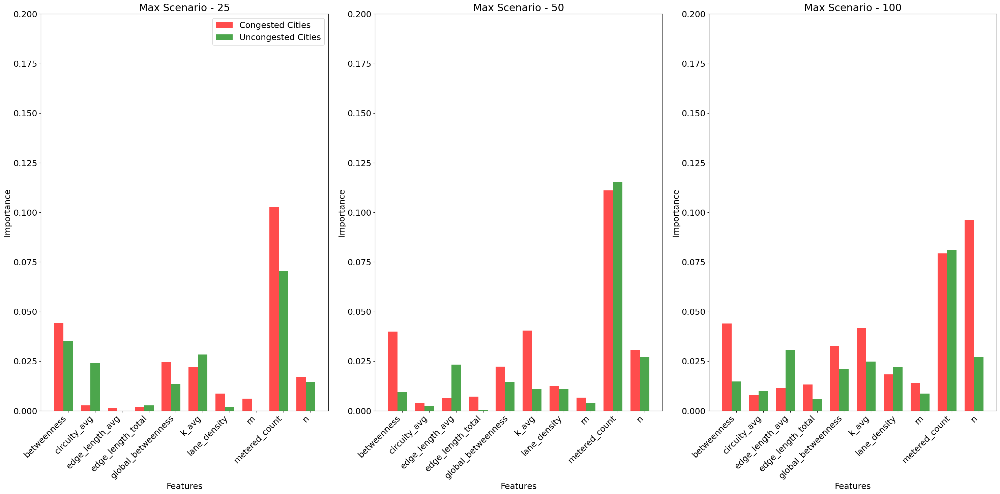

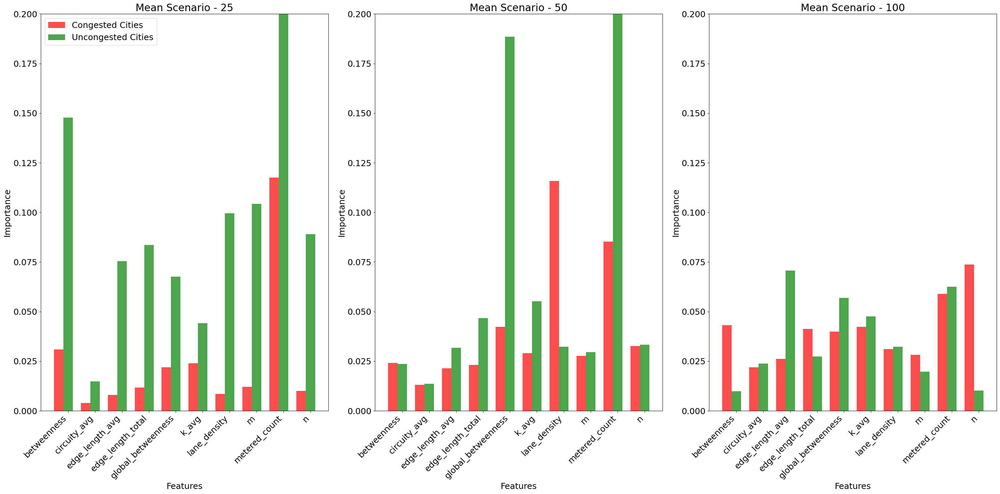

In [85]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Cities List
congested_cities = ["Mumbai", "Auckland", "Istanbul", "MexicoCity", "Bogota", "NewYorkCity", "Capetown", "London"]
uncongested_cities = ["Singapore", "Zurich"]

scales = [25, 50, 100]

def compute_feature_importance_by_city_type(files, city_type, scale):
    dfs_combined = []
    
    for file in files:
        df = pd.read_csv(file)
        
        # Filter by city type and scale
        if city_type == "congested":
            df = df[df['CityName'].isin(congested_cities) & (df['Scale'] == scale)]
        else:
            df = df[df['CityName'].isin(uncongested_cities) & (df['Scale'] == scale)]
        
        dfs_combined.append(df)

    # Combine the dataframes
    combined_df = pd.concat(dfs_combined, ignore_index=True)
    
    # Aggregate feature importance
    feature_importance = combined_df.groupby('Feature')['Value'].mean().sort_values(ascending=False)
    
    return feature_importance



def get_fixed_combined_feature_order(files_list_of_lists):
    all_importances = []
    for files in files_list_of_lists:
        for scale in scales:
            congested_importance = compute_feature_importance_by_city_type(files, "congested", scale)
            uncongested_importance = compute_feature_importance_by_city_type(files, "uncongested", scale)
            combined_importance = (congested_importance + uncongested_importance)
            all_importances.append(combined_importance)
    total_combined_importance = sum(all_importances, start=pd.Series(index=all_importances[0].index, dtype=float)).sort_values(ascending=False)
    return total_combined_importance.index.tolist()


# Getting the fixed order based on both max and mean scenarios and all scales.
combined_order = get_fixed_combined_feature_order([files_max, files_mean])[:10]


def plot_feature_importance_comparison(files, title_suffix):
    N = 10  # Top N features
    barWidth = 0.35

    for idx, scale in enumerate(scales, 1):       
        congested_importance = compute_feature_importance_by_city_type(files, "congested", scale).reindex(fixed_order)
        uncongested_importance = compute_feature_importance_by_city_type(files, "uncongested", scale).reindex(fixed_order)
        
        r1 = np.arange(N)
        r2 = [x + barWidth for x in r1]
        
        plt.subplot(1, 3, idx)  # Three scales, so 1x3 subplot grid
        plt.bar(r1, congested_importance.values, color='r', width=barWidth, label='Congested Cities', alpha=0.7)
        plt.bar(r2, uncongested_importance.values, color='g', width=barWidth, label='Uncongested Cities', alpha=0.7)
        
        plt.title(f"{title_suffix} - {scale}")
        plt.xlabel("Features")
        plt.ylabel("Importance")
        plt.ylim(0, 0.2)
        plt.xticks([r + barWidth for r in range(N)], combined_order, rotation=45, ha="right")
        if idx == 1:
            plt.legend()
        plt.tight_layout()

plt.figure(figsize=(30, 15))

# For Max Scenario
plot_feature_importance_comparison(files_max, "Max Scenario")

plt.figure(figsize=(30, 15))

# For Mean Scenario
plot_feature_importance_comparison(files_mean, "Mean Scenario")

plt.show()

## Flexible plotting function: Compare some columns and filter others

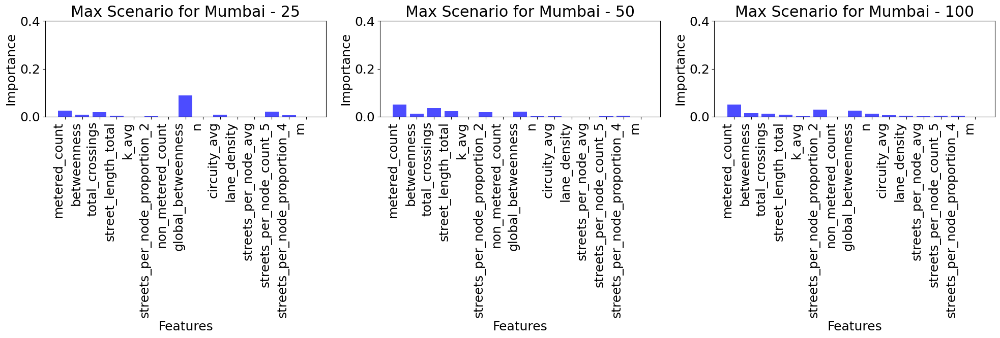

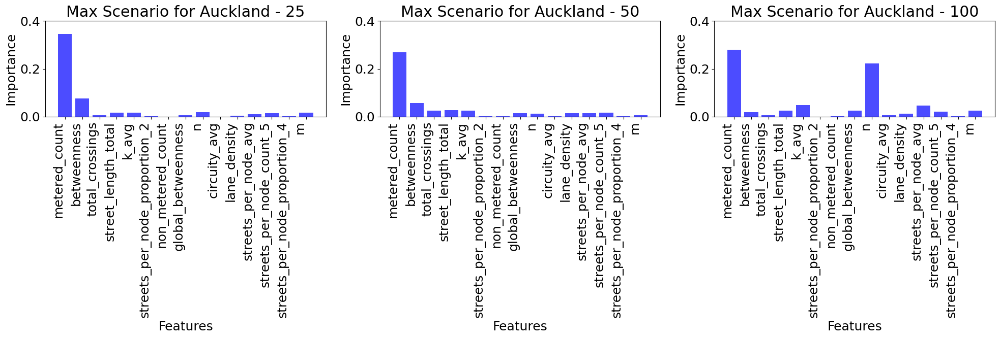

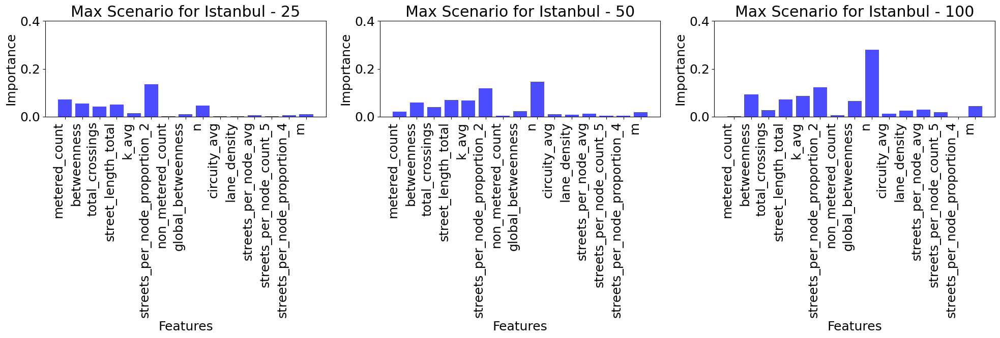

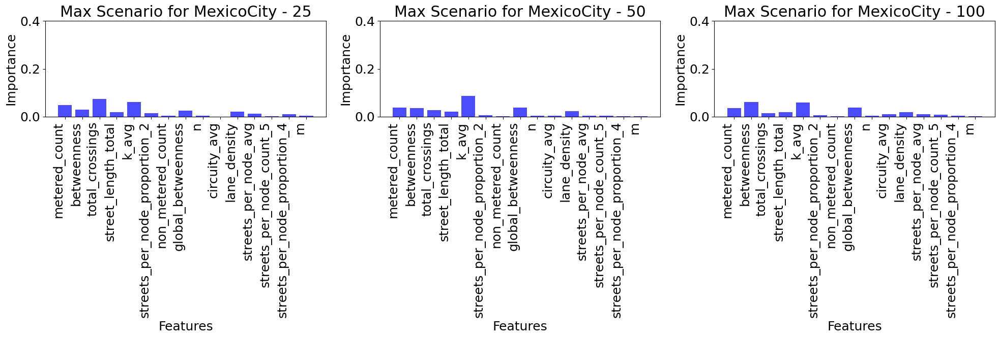

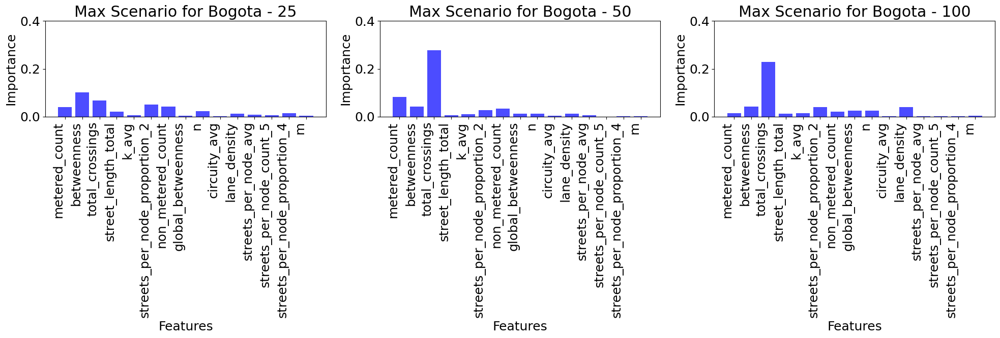

...

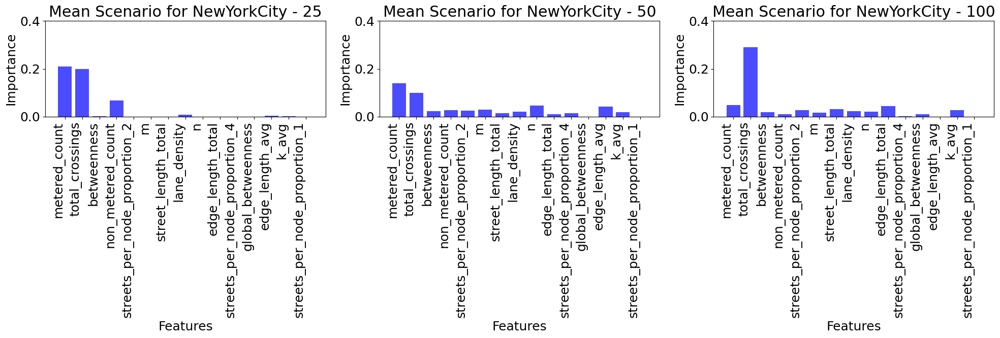

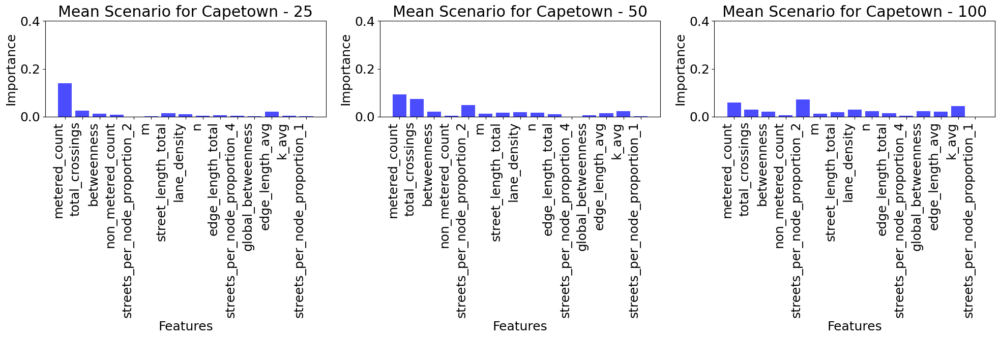

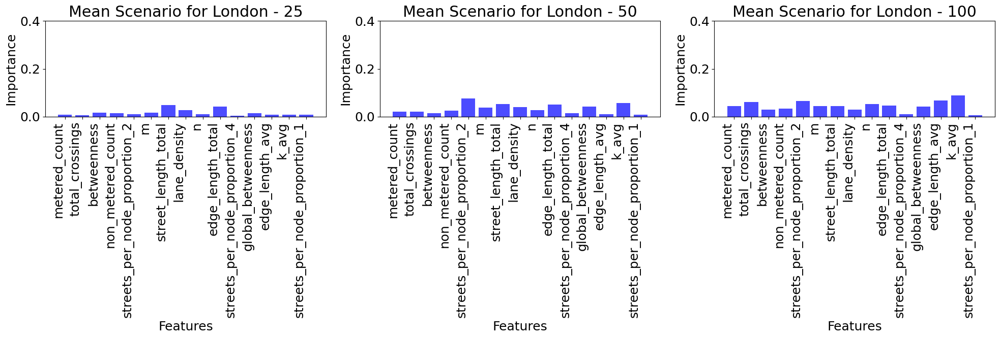

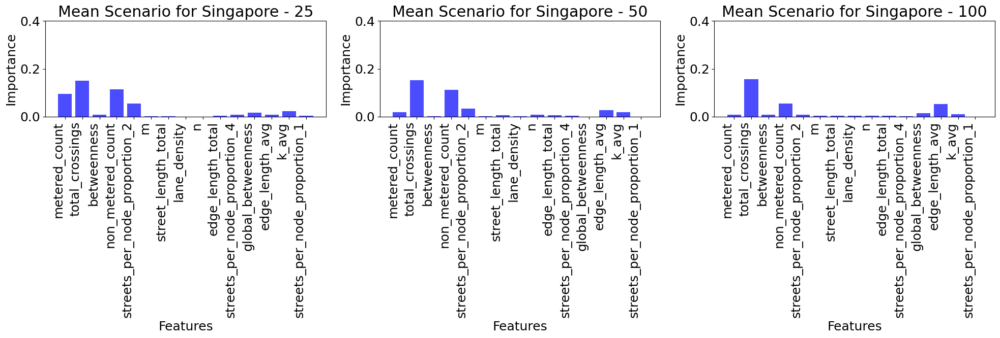

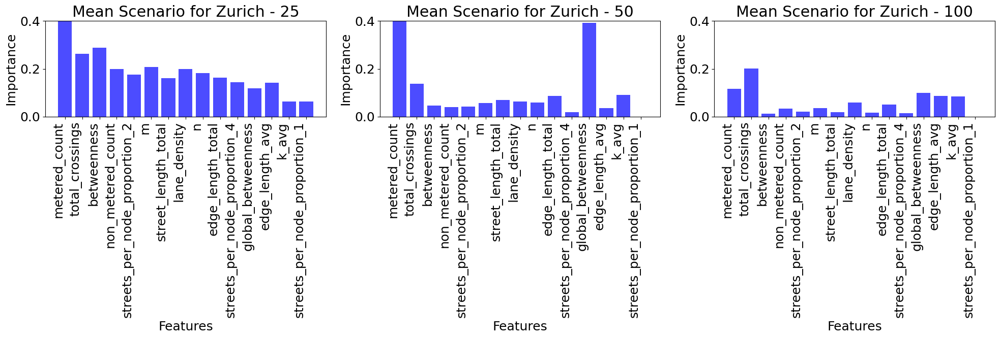

In [90]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Cities List
cities = ["Mumbai", "Auckland", "Istanbul", "MexicoCity", "Bogota", "NewYorkCity", "Capetown", "London", "Singapore", "Zurich"]
scales = [25, 50, 100]

def compute_feature_importance_for_city(files, city, scale):
    dfs_combined = []
    
    for file in files:
        df = pd.read_csv(file)
        
        # Filter by city and scale
        df = df[(df['CityName'] == city) & (df['Scale'] == scale)]
        
        dfs_combined.append(df)

    # Combine the dataframes
    combined_df = pd.concat(dfs_combined, ignore_index=True)
    
    # Aggregate feature importance
    feature_importance = combined_df.groupby('Feature')['Value'].mean().sort_values(ascending=False)
    
    return feature_importance

def get_combined_feature_order(files, scale):
    congested_importance = compute_feature_importance_by_city_type(files, "congested", scale)
    uncongested_importance = compute_feature_importance_by_city_type(files, "uncongested", scale)
    combined_importance = (congested_importance + uncongested_importance).sort_values(ascending=False)
    return combined_importance.index.tolist()

def plot_city_specific_importance(files, title_suffix):
    N = 15  # Top N features
    barWidth = 0.35

    for city in cities:
        plt.figure(figsize=(20, 7))
        for idx, scale in enumerate(scales, 1):
            combined_order = get_combined_feature_order(files, 25)[:N]
            city_importance = compute_feature_importance_for_city(files, city, scale).reindex(combined_order)
            
            plt.subplot(1, 3, idx)  # Three scales, so 1x3 subplot grid
            plt.bar(city_importance.index, city_importance.values, color='b', alpha=0.7)
            
            plt.title(f"{title_suffix} for {city} - {scale}")
            plt.xlabel("Features")
            plt.ylabel("Importance")
            plt.xticks(rotation=90, ha="right")
            plt.ylim(0, 0.4)
            plt.tight_layout()
        plt.show()

# For Max Scenario
plot_city_specific_importance(files_max, "Max Scenario")

# For Mean Scenario
plot_city_specific_importance(files_mean, "Mean Scenario")

/Users/nishant/Documents/GitHub/WCS/urbanscales/process_results/analyse_all_csv_together/all_csv_combined/scripts


### Example usage of this plotting function:

For example, we filter for the city of Singapore, plot the feature importance by TOD, and distingish train and val

Aggregating over ['Scale', 'PlotCounter', 'daytime']


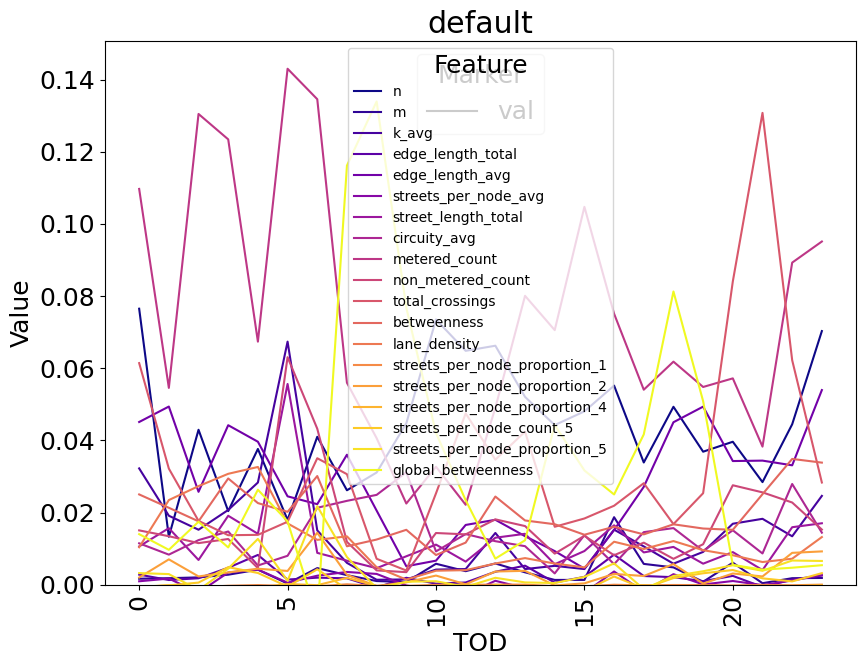

In [65]:
plot_configurations(
    data,
    col_xaxis="TOD", # on the x axis, can either plot time or scale
    compare_col="Feature", # This is the column that will be COLOURED
    compare_second_level="Marker", # This is the column that will be shown by MARKERSTYLE (dotted / normal line)
    eval_col="Value", # This will be shown on the y axis
    agg_method="mean", # how to aggregate the values over the remaining columns
    filter_columns = {"CityName": "Singapore"}
)

In the same manner, we could show the scale on the x axis

### Plotting the features in batches

Aggregating over ['CityName', 'Scale', 'PlotCounter', 'daytime']


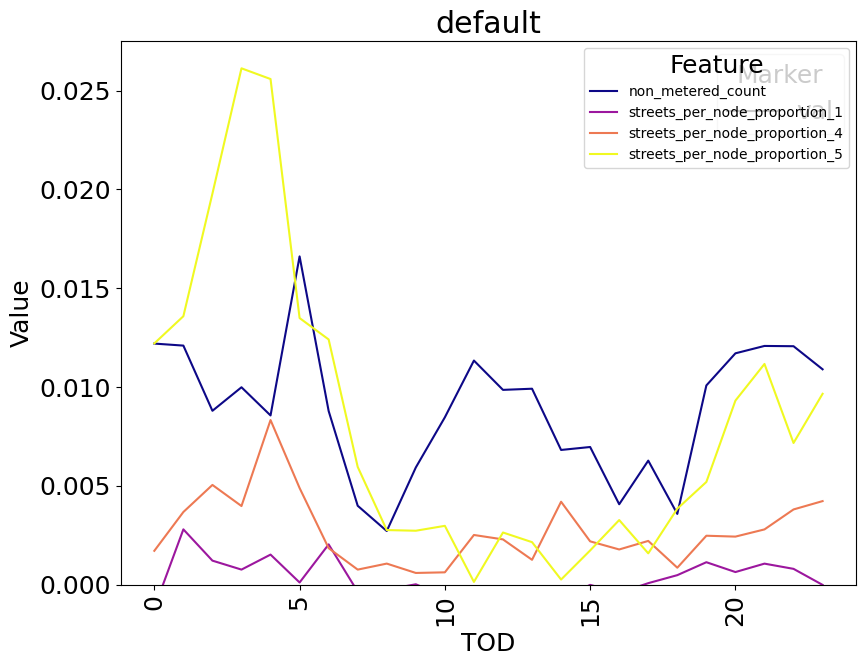

Aggregating over ['CityName', 'Scale', 'PlotCounter', 'daytime']


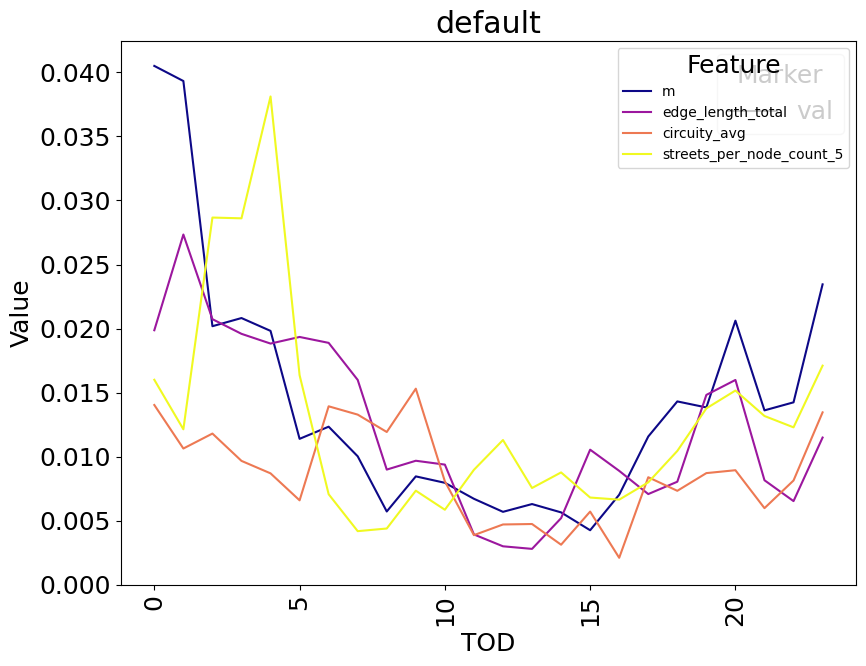

Aggregating over ['CityName', 'Scale', 'PlotCounter', 'daytime']


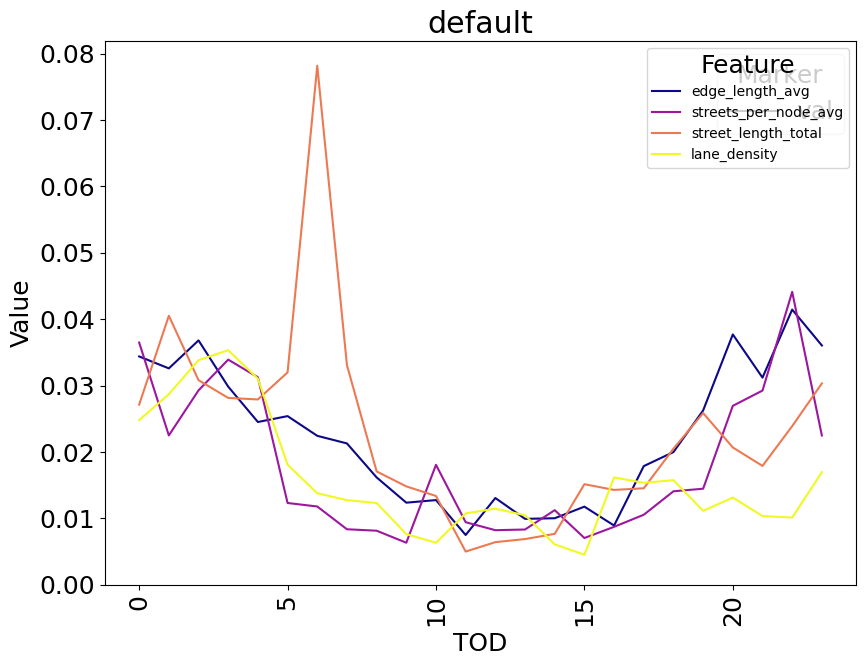

Aggregating over ['CityName', 'Scale', 'PlotCounter', 'daytime']


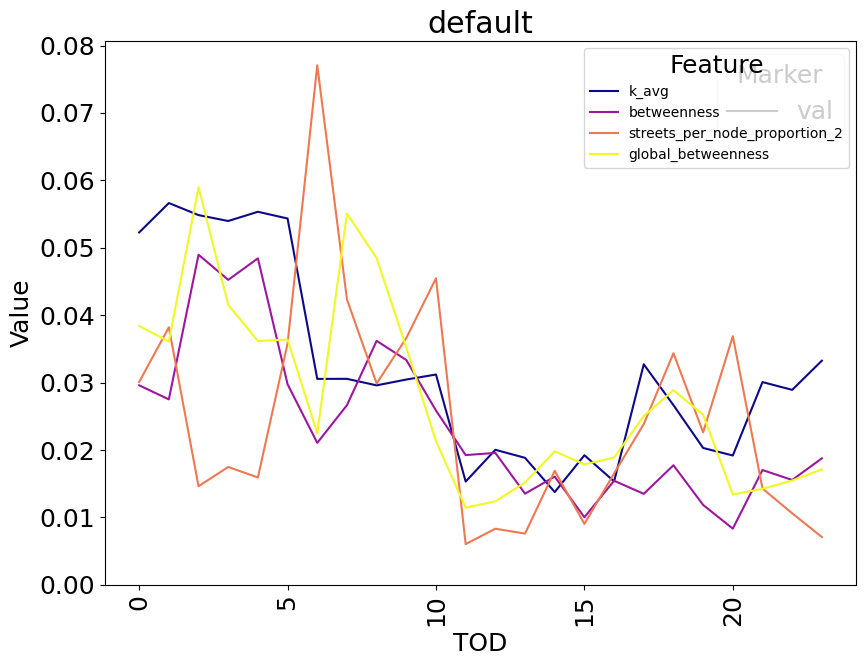

Aggregating over ['CityName', 'Scale', 'PlotCounter', 'daytime']


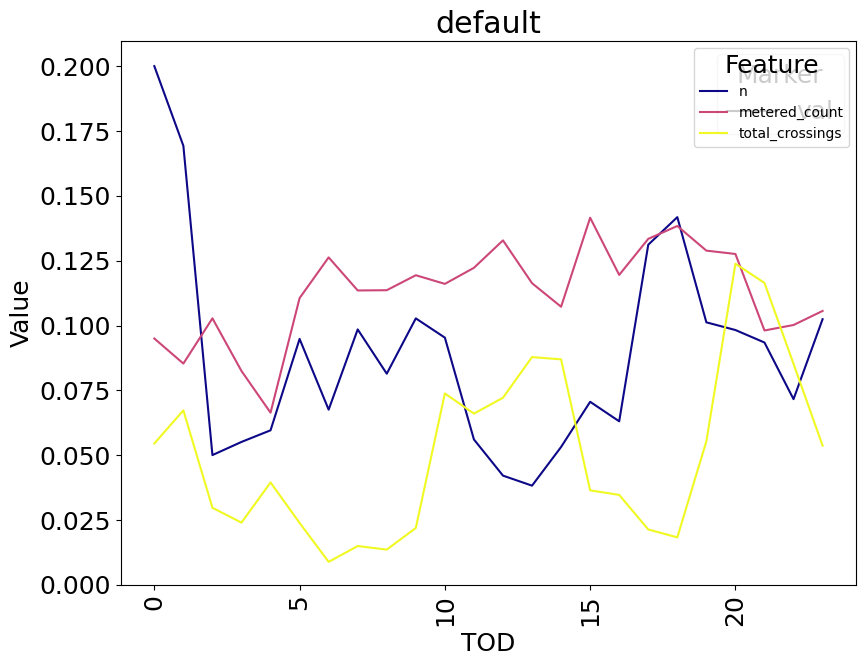

In [66]:
sorted_feat_cols = data.groupby("Feature")["Value"].mean().sort_values().index
for i in range(len(sorted_feat_cols)//4 + 1):
    plot_feats = sorted_feat_cols[i*4: (i+1)*4]
    data_plot = data[data["Feature"].isin(plot_feats)]
    plot_configurations(data_plot)

## Compare features by daytime

The plotting functions works also for categorical labels on the x axis

Aggregating over ['CityName', 'TOD', 'Marker', 'PlotCounter']


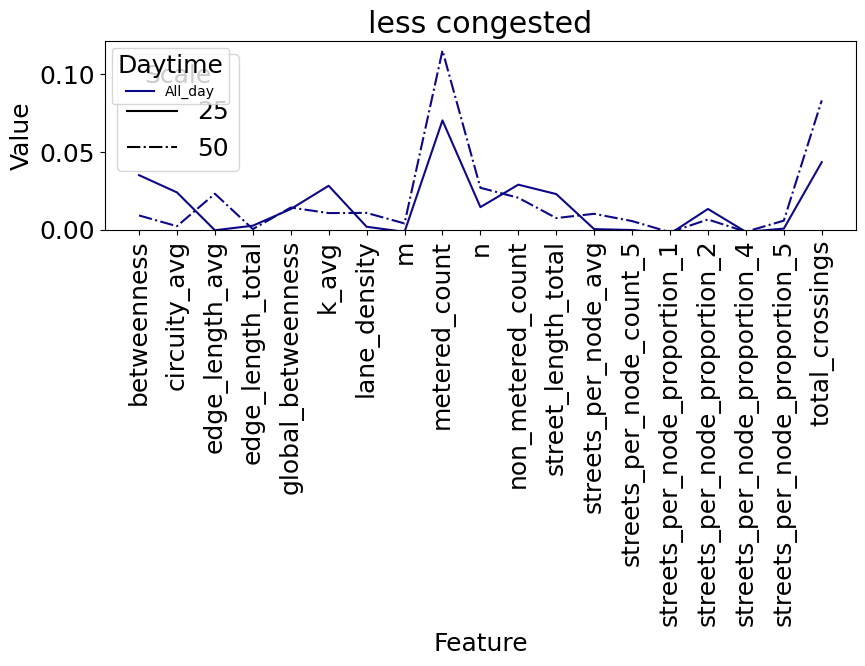

Aggregating over ['CityName', 'TOD', 'Marker', 'PlotCounter']


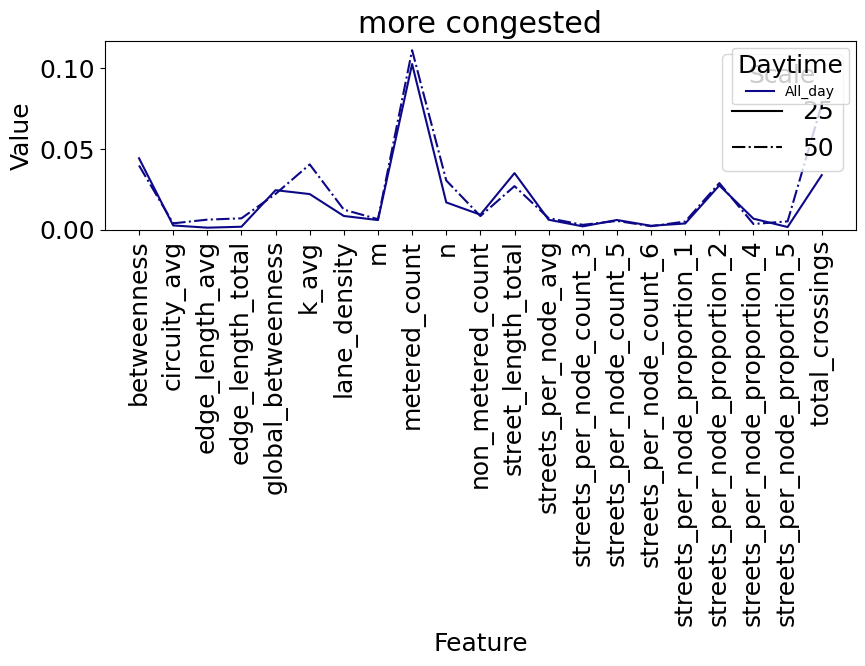

In [71]:
! head -n 1 feature_importance_max_50x50_val.csv > max_three_scales.csv
! tail -n +2 feature_importance_max_25x25_val.csv >> max_three_scales.csv
! tail -n +2 feature_importance_max_50x50_val.csv >> max_three_scales.csv
# ! tail -n +2 feature_importance_max_100x100_val.csv >> max_three_scales.csv

! head -n 1 max_three_scales.csv > less_congested_cities.csv
! grep -E "Singapore|Zurich" max_three_scales.csv >> less_congested_cities.csv

! head -n 1 max_three_scales.csv > highly_congested_cities.csv
! grep -E "Mumbai|Auckland|Istanbul|MexicoCity|Bogota|NewYorkCity|Capetown|London" max_three_scales.csv >> highly_congested_cities.csv

data = pd.read_csv("less_congested_cities.csv")
# data["daytime"] = data["TOD"].apply(new_datetime)
data["daytime"] = "All_day"
sorted_data = data.sort_values("Value")
plot_configurations(sorted_data, col_xaxis="Feature", compare_col="daytime", compare_second_level="Scale", title="less congested")

data = pd.read_csv("highly_congested_cities.csv")
# data["daytime"] = data["TOD"].apply(new_datetime)
data["daytime"] = "All_day"
sorted_data = data.sort_values("Value")
plot_configurations(sorted_data, col_xaxis="Feature", compare_col="daytime", compare_second_level="Scale", title="more congested")

Aggregating over ['CityName', 'TOD', 'Marker', 'PlotCounter']


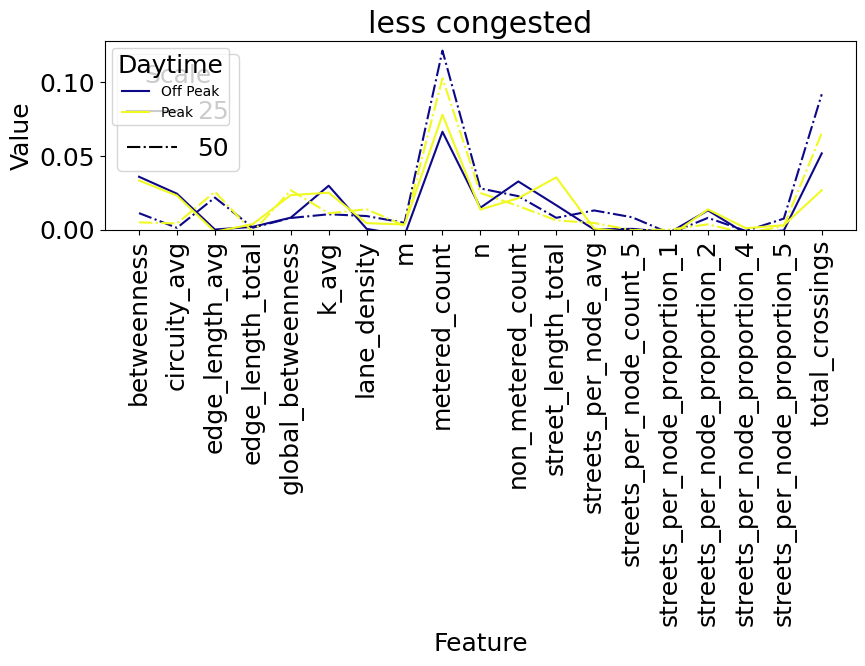

Aggregating over ['CityName', 'TOD', 'Marker', 'PlotCounter']


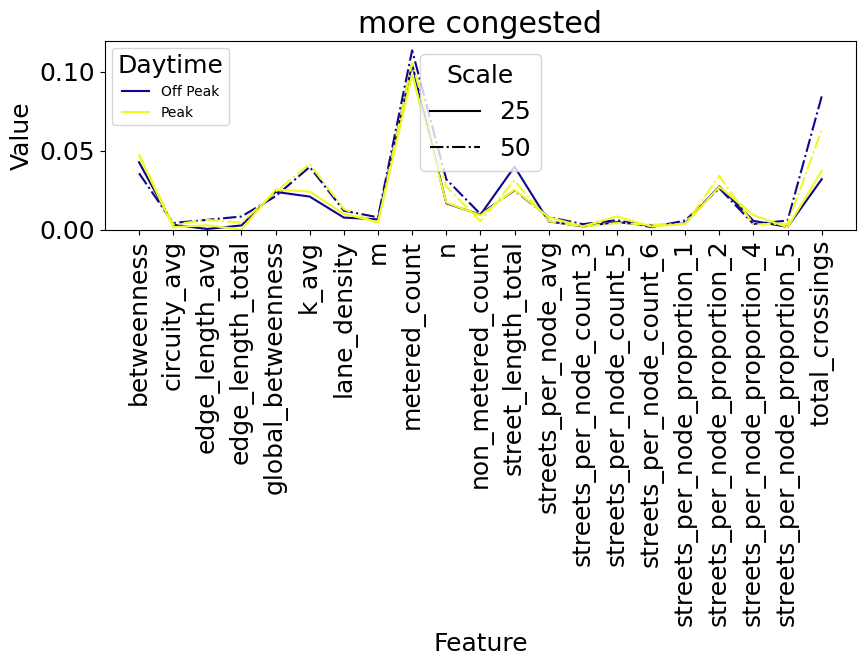

In [72]:
! head -n 1 feature_importance_max_50x50_val.csv > max_three_scales.csv
! tail -n +2 feature_importance_max_25x25_val.csv >> max_three_scales.csv
! tail -n +2 feature_importance_max_50x50_val.csv >> max_three_scales.csv
# ! tail -n +2 feature_importance_max_100x100_val.csv >> max_three_scales.csv

! head -n 1 max_three_scales.csv > less_congested_cities.csv
! grep -E "Singapore|Zurich" max_three_scales.csv >> less_congested_cities.csv

! head -n 1 max_three_scales.csv > highly_congested_cities.csv
! grep -E "Mumbai|Auckland|Istanbul|MexicoCity|Bogota|NewYorkCity|Capetown|London" max_three_scales.csv >> highly_congested_cities.csv

data = pd.read_csv("less_congested_cities.csv")
data["daytime"] = data["TOD"].apply(new_datetime)
sorted_data = data.sort_values("Value")
plot_configurations(sorted_data, col_xaxis="Feature", compare_col="daytime", compare_second_level="Scale", title="less congested")

data = pd.read_csv("highly_congested_cities.csv")
data["daytime"] = data["TOD"].apply(new_datetime)
sorted_data = data.sort_values("Value")
plot_configurations(sorted_data, col_xaxis="Feature", compare_col="daytime", compare_second_level="Scale", title="more congested")

### Further ideas:

* It would be important to show which features are consistently important across cities. If a feature is very important in some cities but not in others, it could be investigated why this happens.

Aggregating over ['CityName', 'TOD', 'Marker', 'PlotCounter']


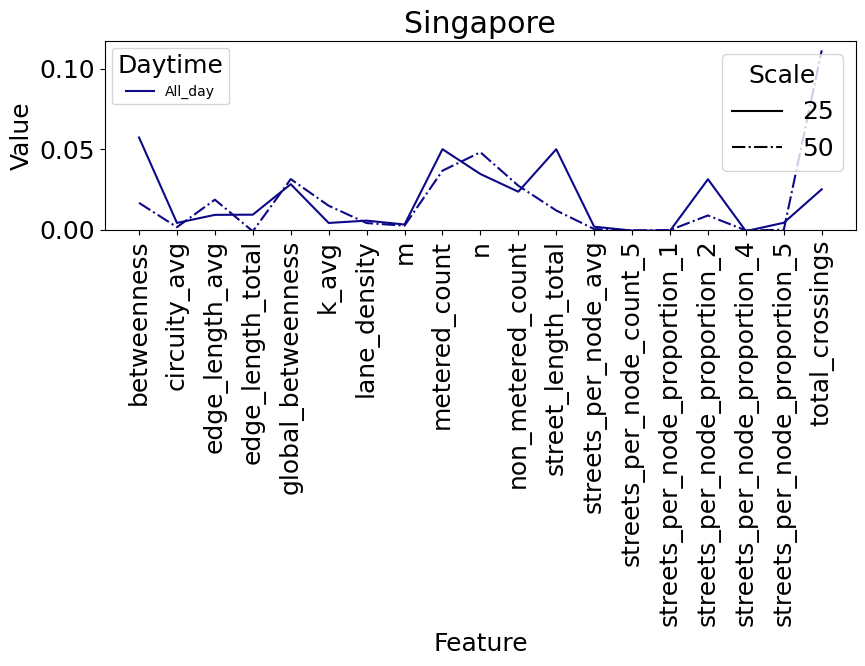

Aggregating over ['CityName', 'TOD', 'Marker', 'PlotCounter']


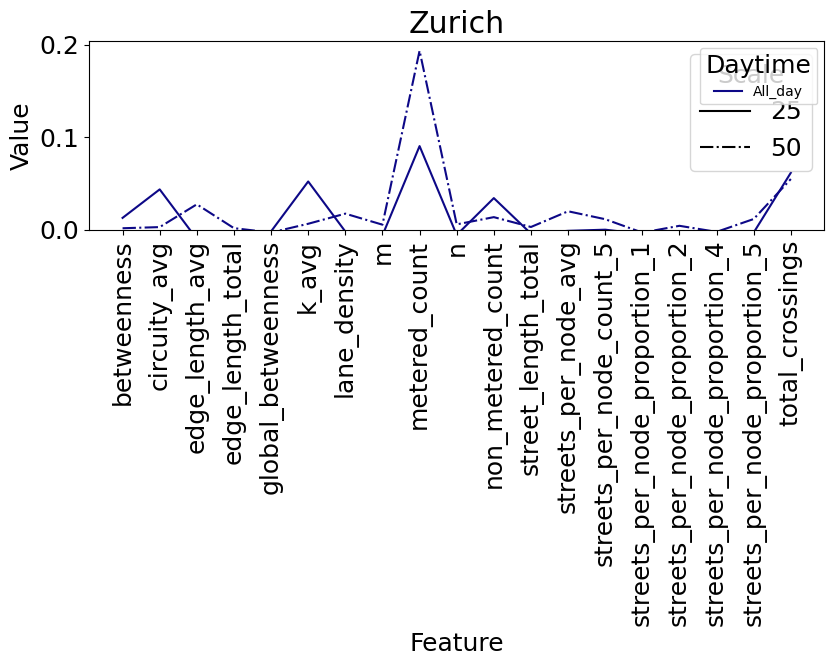

Aggregating over ['CityName', 'TOD', 'Marker', 'PlotCounter']


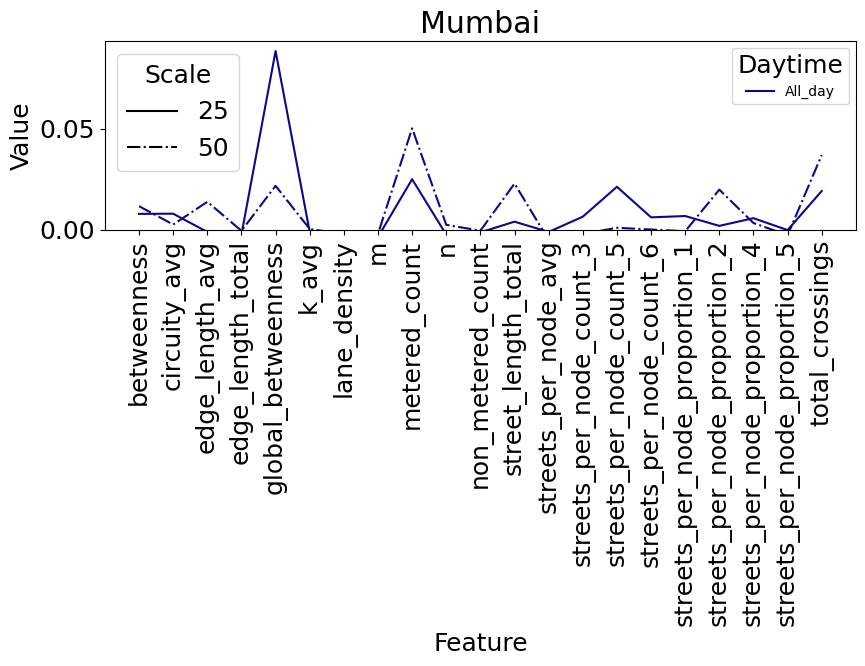

Aggregating over ['CityName', 'TOD', 'Marker', 'PlotCounter']


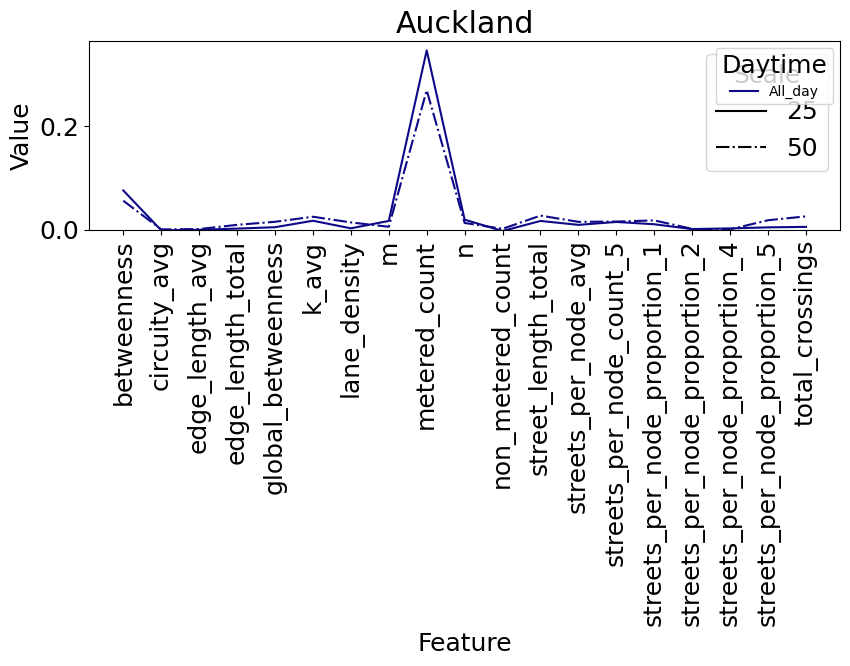

Aggregating over ['CityName', 'TOD', 'Marker', 'PlotCounter']


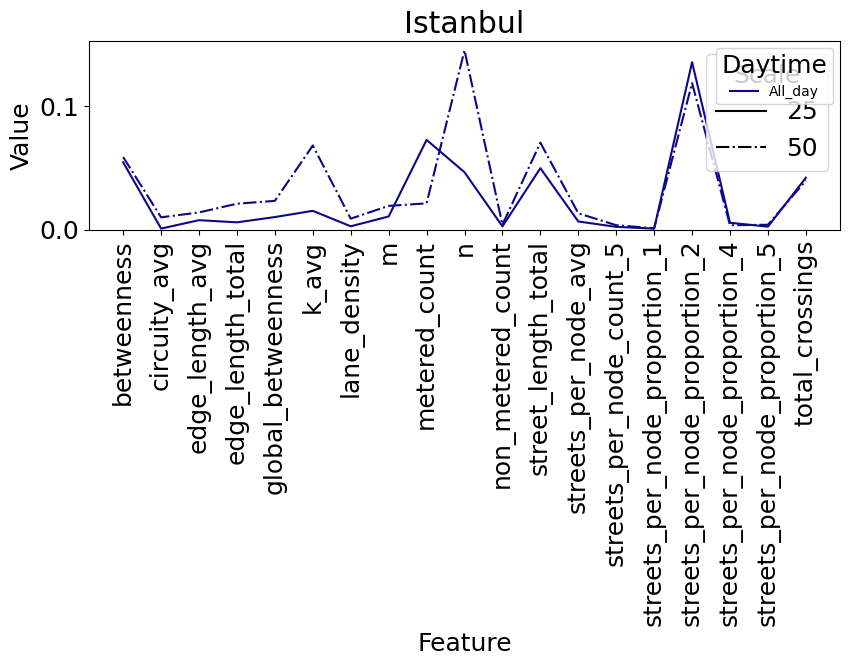

Aggregating over ['CityName', 'TOD', 'Marker', 'PlotCounter']


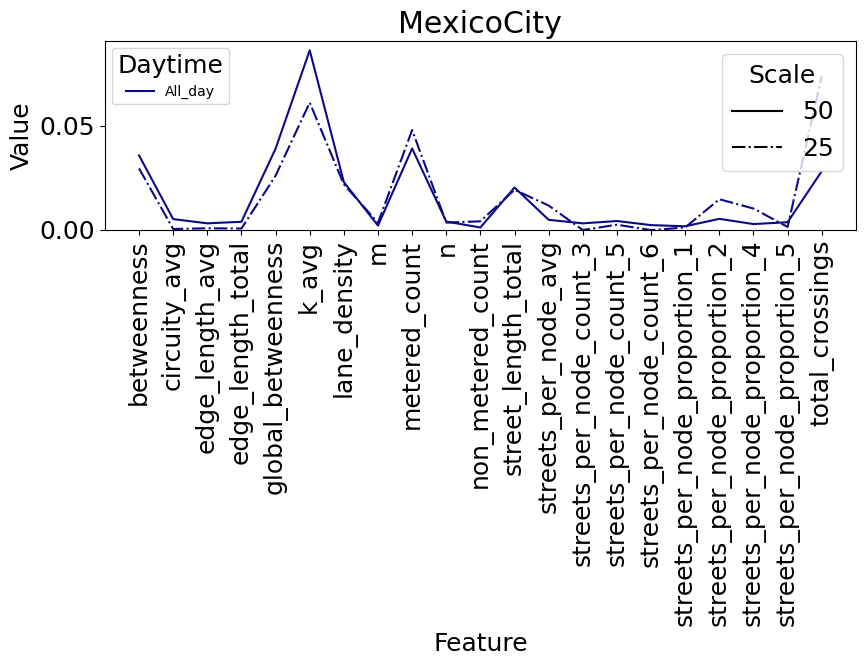

Aggregating over ['CityName', 'TOD', 'Marker', 'PlotCounter']


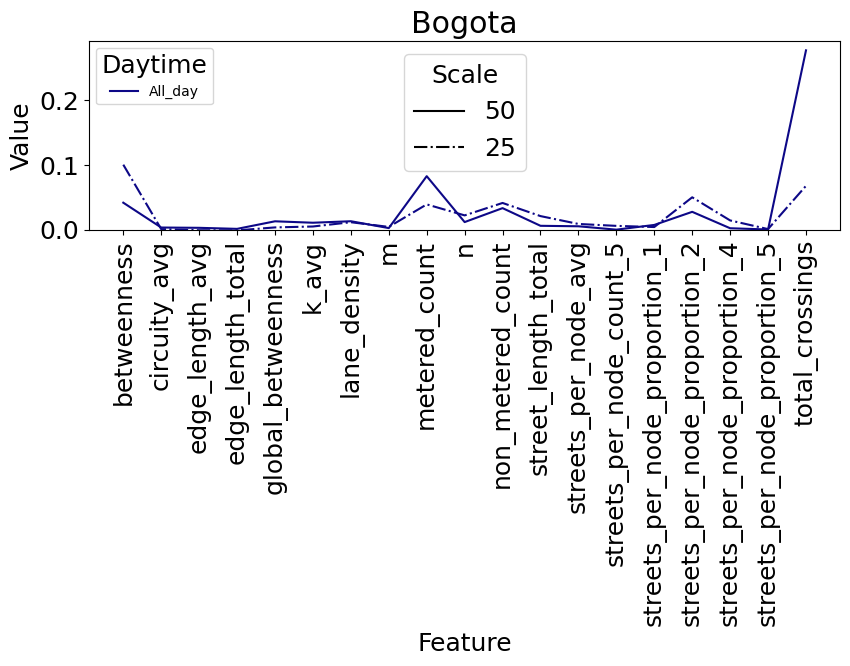

Aggregating over ['CityName', 'TOD', 'Marker', 'PlotCounter']


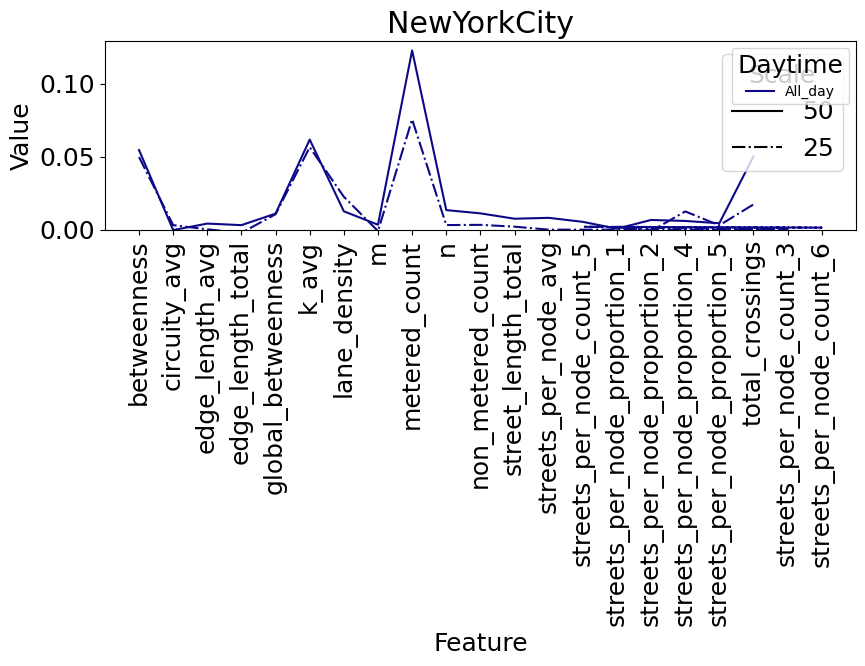

Aggregating over ['CityName', 'TOD', 'Marker', 'PlotCounter']


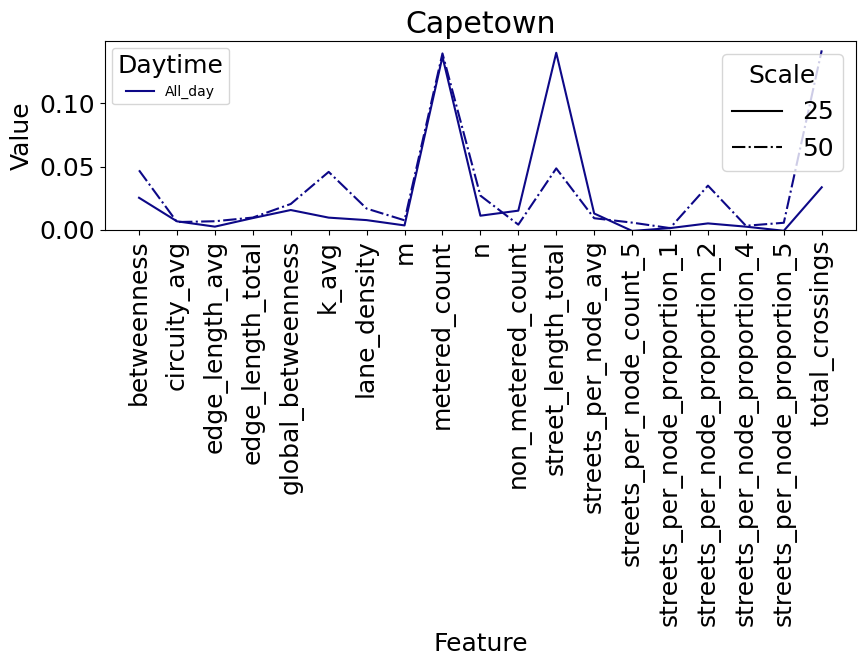

Aggregating over ['CityName', 'TOD', 'Marker', 'PlotCounter']


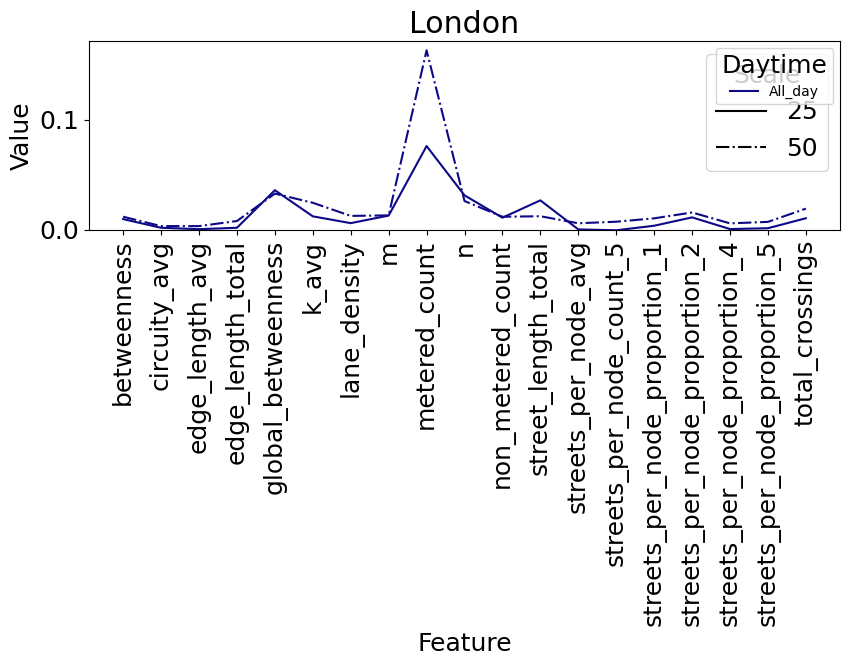

In [73]:
import pandas as pd

cities = [
    "Singapore", "Zurich", "Mumbai", "Auckland", "Istanbul", 
    "MexicoCity", "Bogota", "NewYorkCity", "Capetown", "London"
]

# Extract the header from mean_/ max three_scales.csv
with open("max_three_scales.csv", 'r') as main_file:
    header = main_file.readline().strip()

for city in cities:
    city_file = f"{city}_data.csv"
    
    # Extract relevant rows for the city
    with open("max_three_scales.csv", 'r') as main_file, open(city_file, 'w') as city_specific:
        for line in main_file:
            if city in line or header in line:
                city_specific.write(line)
    
    # Read the city-specific data into pandas
    data = pd.read_csv(city_file)
    
    # Update and sort data, then plot
    data["daytime"] = "All_day"
    sorted_data = data.sort_values("Value")
    plot_configurations(sorted_data, col_xaxis="Feature", compare_col="daytime", compare_second_level="Scale", title=city)


Aggregating over ['CityName', 'TOD', 'Marker', 'PlotCounter']


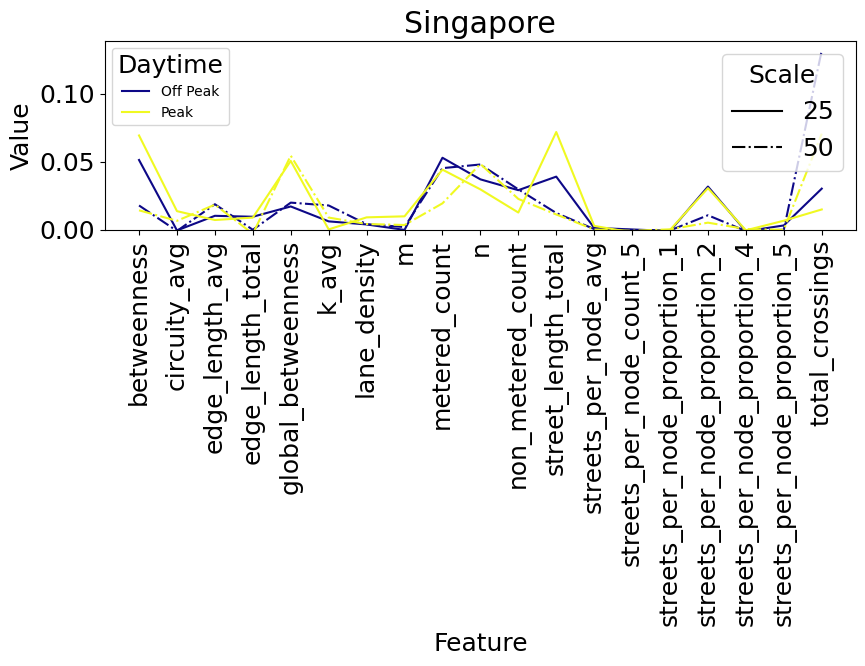

Aggregating over ['CityName', 'TOD', 'Marker', 'PlotCounter']


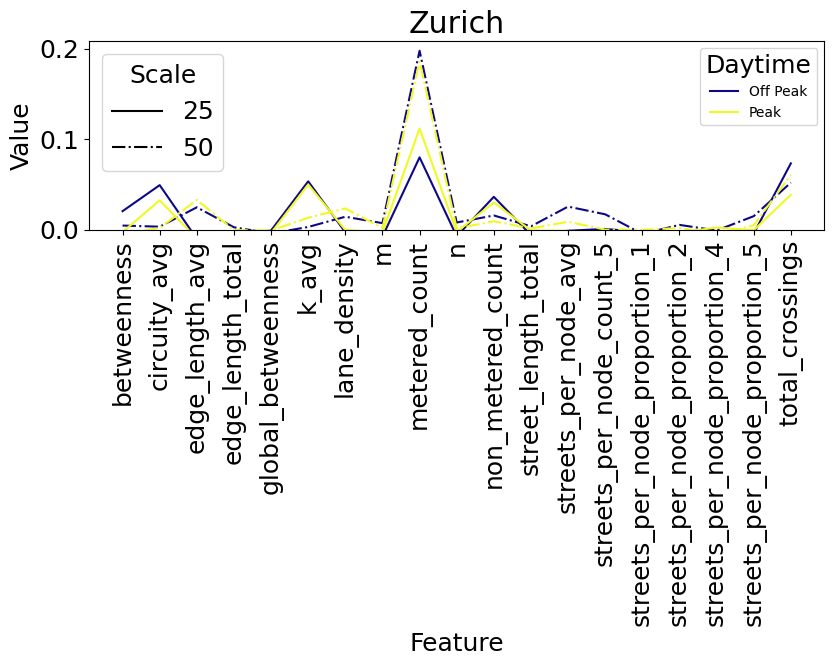

Aggregating over ['CityName', 'TOD', 'Marker', 'PlotCounter']


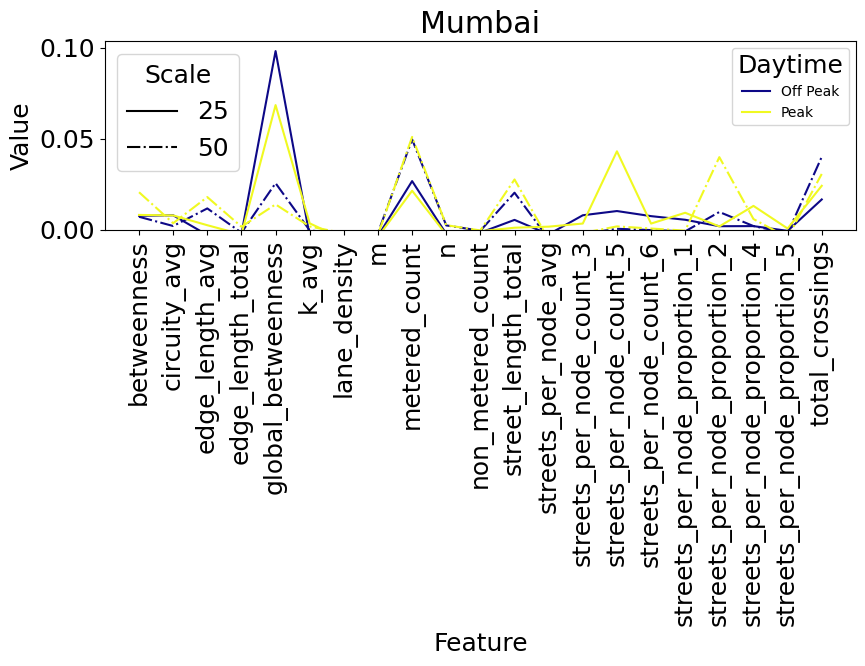

Aggregating over ['CityName', 'TOD', 'Marker', 'PlotCounter']


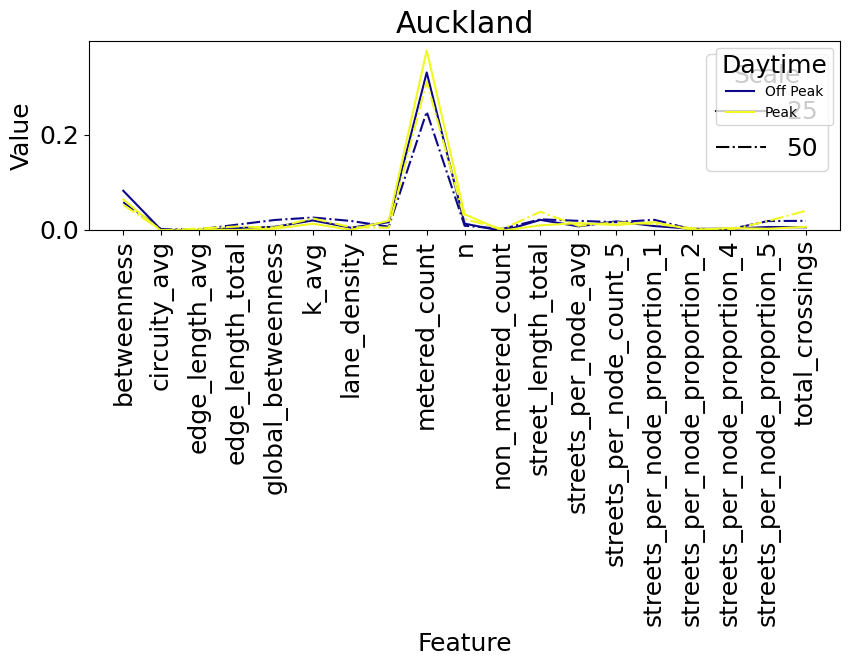

Aggregating over ['CityName', 'TOD', 'Marker', 'PlotCounter']


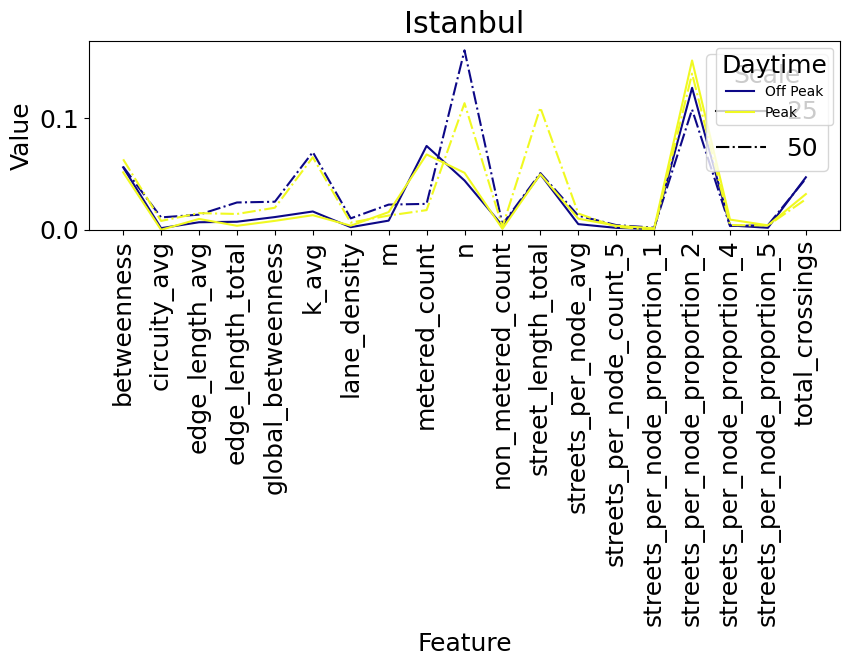

Aggregating over ['CityName', 'TOD', 'Marker', 'PlotCounter']


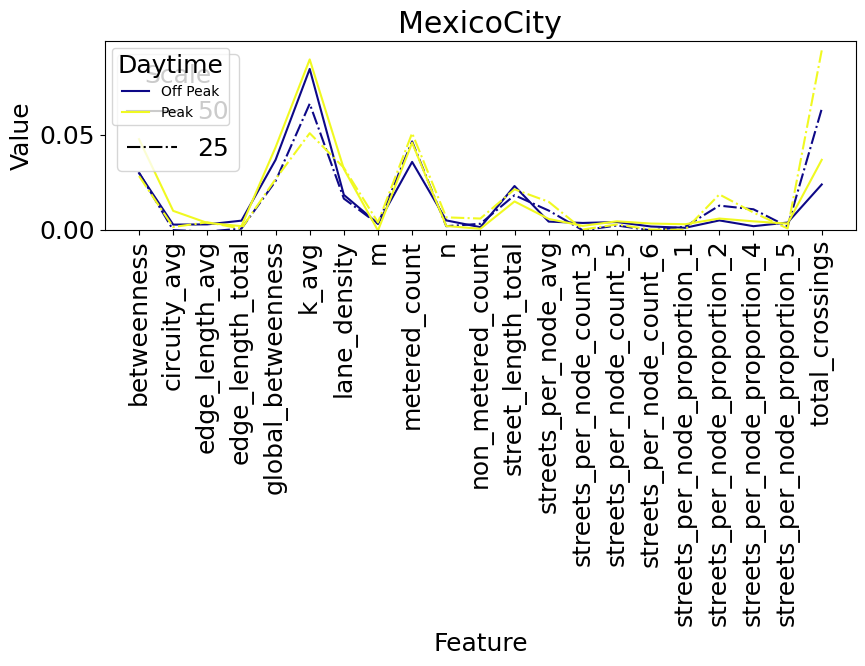

Aggregating over ['CityName', 'TOD', 'Marker', 'PlotCounter']


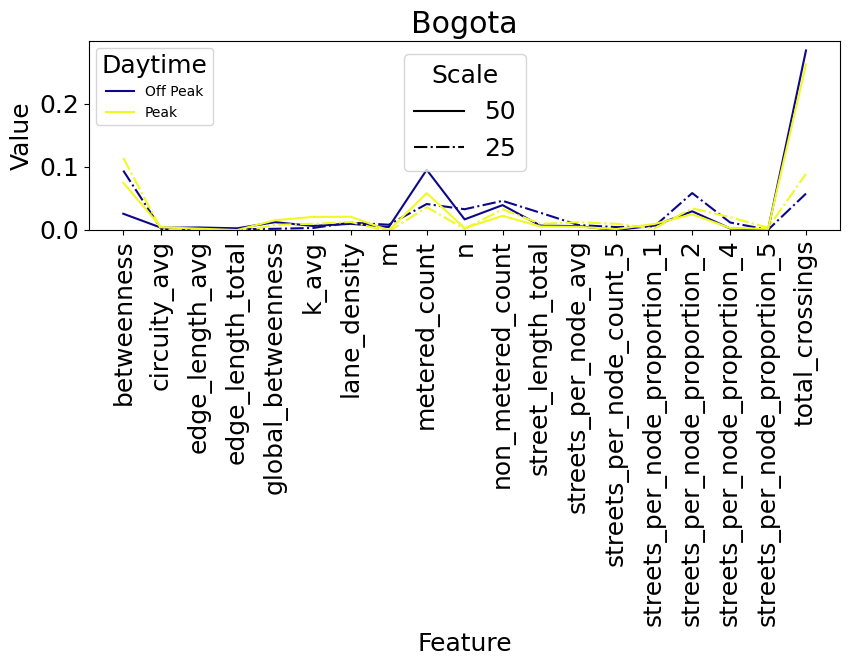

Aggregating over ['CityName', 'TOD', 'Marker', 'PlotCounter']


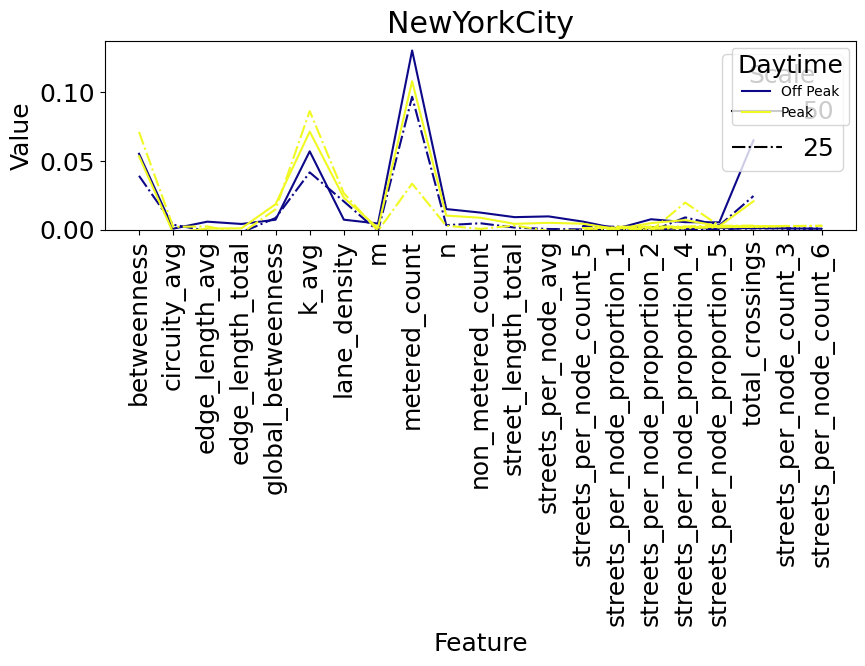

Aggregating over ['CityName', 'TOD', 'Marker', 'PlotCounter']


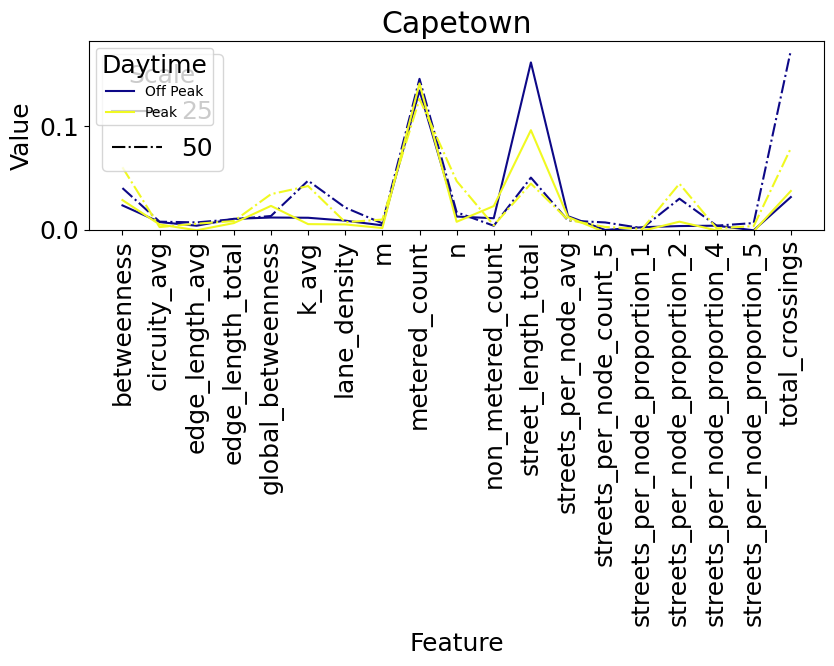

Aggregating over ['CityName', 'TOD', 'Marker', 'PlotCounter']


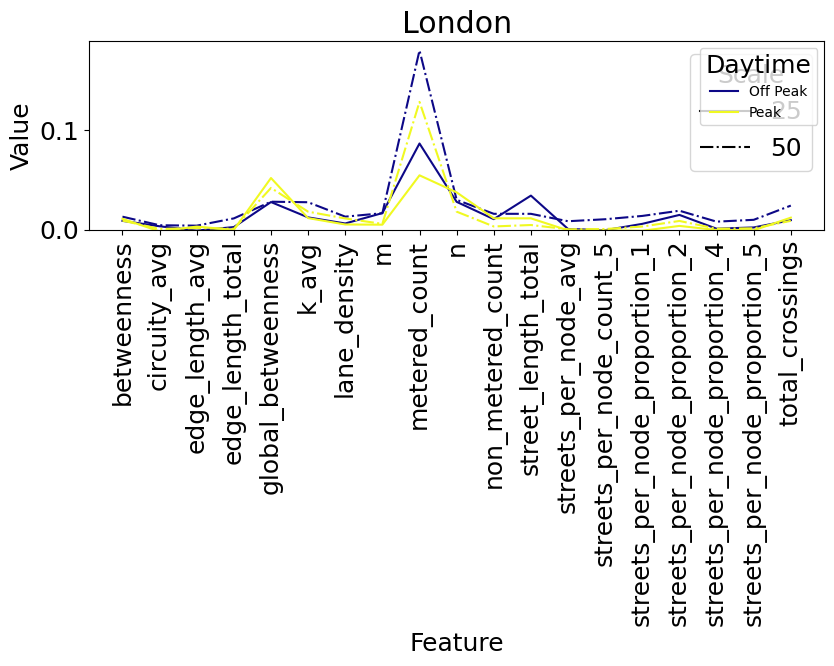

In [74]:
import pandas as pd

cities = [
    "Singapore", "Zurich", "Mumbai", "Auckland", "Istanbul", 
    "MexicoCity", "Bogota", "NewYorkCity", "Capetown", "London"
]

# Extract the header from mean_/ max three_scales.csv
with open("max_three_scales.csv", 'r') as main_file:
    header = main_file.readline().strip()

for city in cities:
    city_file = f"{city}_data.csv"
    
    # Extract relevant rows for the city
    with open("max_three_scales.csv", 'r') as main_file, open(city_file, 'w') as city_specific:
        for line in main_file:
            if city in line or header in line:
                city_specific.write(line)
    
    # Read the city-specific data into pandas
    data = pd.read_csv(city_file)
    
    # Update and sort data, then plot
    data["daytime"] = data["TOD"].apply(new_datetime)
    sorted_data = data.sort_values("Value")
    plot_configurations(sorted_data, col_xaxis="Feature", compare_col="daytime", compare_second_level="Scale", title=city)
